In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import time
import plotly.express as px
import plotly.graph_objects as go
import os
import geopandas as gpd
import libpysal as ps
import statsmodels.api as sm
import warnings
from datetime import datetime
from matplotlib.ticker import FormatStrFormatter
from pylab import rcParams
from mgwr.gwr import GWR, MGWR
from mgwr.sel_bw import Sel_BW
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
pd.set_option('display.max_columns', None)
mpl.rcParams['figure.dpi'] = 150
sns.set_style("darkgrid")
sns.set_context(context="paper", font_scale=1.5)
sns.set(font="serif")
os.environ['USE_PYGEOS'] = '0'
warnings.filterwarnings('ignore')

In [2]:
os.chdir("C:\\Users\\omkarp\\Downloads\\Hannes\\Trips\\") 
data = gpd.read_file('GOT_attrib.shp')
data = data.dropna()
data = data.reset_index(drop=True)
data = data.rename(columns={'cars/pop':'CarOwnPop', '<=30 %':'Yngpop', 'malepop %':'mlepop_prop'}, errors='raise')
label_encoder = LabelEncoder()
data['month'] = label_encoder.fit_transform(data['month'])
data['Day'] = label_encoder.fit_transform(data['weekday'])
data.head()

Cannot find header.dxf (GDAL_DATA is not defined)


,BASOMRÅDE,Area_m2,month,weekday,count_trip,avg temp,max temp,min temp,avg precip,max precip,min precip,avg Wind s,max Wind s,min Wind s,daily dema,pop.dens,Higher edu,openly une,Average in,Proportion,distance,LUP_Commer,LUP_Educat,LUP_Health,LUP_Other,LUP_Public,LUP_Recrea,LUP_Reside,AreaProx,Rd_Resi,Rd_Arte,Rd_Comml,Rd_Cyc,Rd_Pedes,Rd_Other,AREA_KM2,Population,CarOwnPop,mlepop_prop,Yngpop,geometry,Day
0,10101,72488.5,0,Weekday,5.733333,9.659318,14.353333,3.980000,0.012778,0.100000,0.0,3.208667,5.093333,1.226667,3.260563,4744.285714,46.1,6.2,313100.0,0.059934,926.948256,0.433173,0.0,0.0,0.09274,0.387015,0.0,0.087072,0.382295,186.489991,2166.617857,1323.043464,681.868716,963.726336,6.579349,0.07,351.0,0.19943,0.527066,0.344729,"POLYGON Z ((144590.135 6396532.436 0.000, 1445...",0
1,10101,72488.5,0,Weekend,4.500000,8.454167,12.333333,4.050000,0.001389,0.033333,0.0,4.693056,6.883333,2.100000,3.260563,4744.285714,46.1,6.2,313100.0,0.059934,926.948256,0.433173,0.0,0.0,0.09274,0.387015,0.0,0.087072,0.382295,186.489991,2166.617857,1323.043464,681.868716,963.726336,6.579349,0.07,351.0,0.19943,0.527066,0.344729,"POLYGON Z ((144590.135 6396532.436 0.000, 1445...",1
2,10101,72488.5,1,Weekday,5.850000,19.652986,23.848333,15.968333,0.151458,1.363333,0.0,3.078542,4.458333,1.590000,3.260563,4744.285714,46.1,6.2,313100.0,0.059934,926.948256,0.433173,0.0,0.0,0.09274,0.387015,0.0,0.087072,0.382295,186.489991,2166.617857,1323.043464,681.868716,963.726336,6.579349,0.07,351.0,0.19943,0.527066,0.344729,"POLYGON Z ((144590.135 6396532.436 0.000, 1445...",0
3,10101,72488.5,1,Weekend,4.125000,18.889063,22.337500,15.062500,0.007292,0.175000,0.0,3.556771,4.912500,1.787500,3.260563,4744.285714,46.1,6.2,313100.0,0.059934,926.948256,0.433173,0.0,0.0,0.09274,0.387015,0.0,0.087072,0.382295,186.489991,2166.617857,1323.043464,681.868716,963.726336,6.579349,0.07,351.0,0.19943,0.527066,0.344729,"POLYGON Z ((144590.135 6396532.436 0.000, 1445...",1
4,10101,72488.5,2,Weekday,2.100000,-3.405719,-0.300000,-7.210000,0.032778,0.423333,0.0,2.932899,4.376667,1.536667,3.260563,4744.285714,46.1,6.2,313100.0,0.059934,926.948256,0.433173,0.0,0.0,0.09274,0.387015,0.0,0.087072,0.382295,186.489991,2166.617857,1323.043464,681.868716,963.726336,6.579349,0.07,351.0,0.19943,0.527066,0.344729,"POLYGON Z ((144590.135 6396532.436 0.000, 1445...",0


In [3]:
month_counts = data.groupby('month').size()
month_counts

month
0     757
1     868
2     761
3     883
4     884
5     843
6      60
7     822
8     843
9     804
10    790
dtype: int64

In [4]:
# Filter for January, April, August to manage the data size and model appropriateness!
new_df = data[data['month'].isin([1,4,8])]
new_df['month'] = new_df['month'].apply(lambda x: 1 if x == 1 else (2 if x == 4 else 0))
if 'month' in new_df.columns:
    # Group by 'BASOMRÅDE', 'month', and 'Day', then calculate the mean of 'count_trip'
    aggregated_data = new_df.groupby(['BASOMRÅDE', 'month', 'Day'])['count_trip'].mean().reset_index()
else:
    raise KeyError("Column 'month' not found in DataFrame")

# Step 3: Keep only the specified columns
columns_to_keep = ['BASOMRÅDE', 'Day', 'max precip', 'min Wind s', 'Proportion', 'CarOwnPop', 'Yngpop', 'Area_m2', 'AreaProx', 
                   'distance', 'LUP_Commer', 'LUP_Educat', 'LUP_Health', 'LUP_Other', 'LUP_Public', 'LUP_Recrea', 'LUP_Reside', 
                   'Rd_Resi', 'Rd_Arte', 'Rd_Comml', 'Rd_Cyc', 'Rd_Pedes', 'Rd_Other', 'Population', 'month', 'geometry']

filtered_df = new_df[columns_to_keep].copy()

# Merge aggregated data back into the filtered DataFrame using 'BASOMRÅDE', 'month', and 'Day' as keys
data = filtered_df.merge(aggregated_data, on=['BASOMRÅDE', 'month', 'Day'], how='left')

data['Trip_norm'] = (data['count_trip'] / data['Area_m2']) * 1000000
data['centroid'] = data.geometry.centroid
data['x'] = data['centroid'].x
data['y'] = data['centroid'].y

data.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2595 entries, 0 to 2594
Data columns (total 31 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   BASOMRÅDE   2595 non-null   int64   
 1   Day         2595 non-null   int32   
 2   max precip  2595 non-null   float64 
 3   min Wind s  2595 non-null   float64 
 4   Proportion  2595 non-null   float64 
 5   CarOwnPop   2595 non-null   float64 
 6   Yngpop      2595 non-null   float64 
 7   Area_m2     2595 non-null   float64 
 8   AreaProx    2595 non-null   float64 
 9   distance    2595 non-null   float64 
 10  LUP_Commer  2595 non-null   float64 
 11  LUP_Educat  2595 non-null   float64 
 12  LUP_Health  2595 non-null   float64 
 13  LUP_Other   2595 non-null   float64 
 14  LUP_Public  2595 non-null   float64 
 15  LUP_Recrea  2595 non-null   float64 
 16  LUP_Reside  2595 non-null   float64 
 17  Rd_Resi     2595 non-null   float64 
 18  Rd_Arte     2595 non-null   float64 
 19

In [5]:
data.crs

<Projected CRS: EPSG:3007>
Name: SWEREF99 12 00
Axis Info [cartesian]:
- N[north]: Northing (metre)
- E[east]: Easting (metre)
Area of Use:
- name: Sweden - communes west of approximately 12°45'E and south of approximately 60°N. See information source for map.
- bounds: (10.93, 56.74, 13.11, 60.13)
Coordinate Operation:
- name: SWEREF99 12 00
- method: Transverse Mercator
Datum: SWEREF99
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

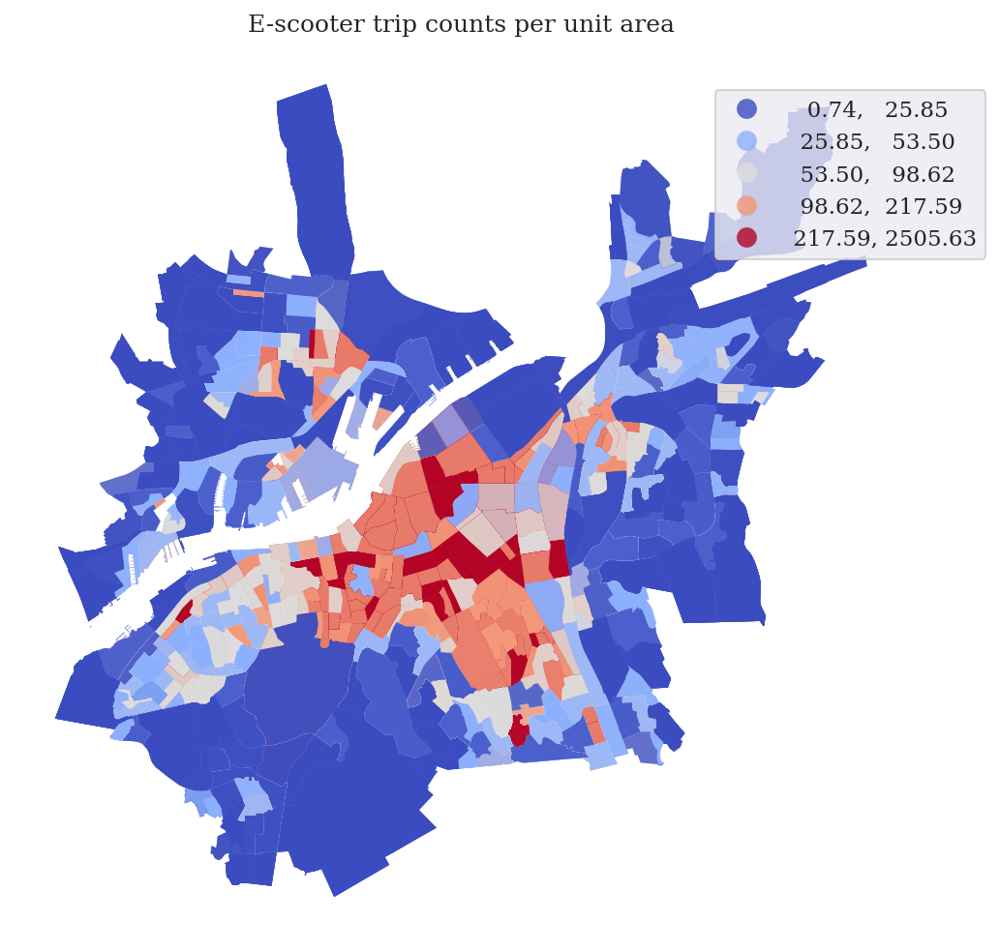

In [6]:
fig, ax = plt.subplots(figsize=(12, 8))
data.plot(column='Trip_norm', cmap='coolwarm', linewidth=0.01, scheme='quantiles', k=5, legend=True, 
         legend_kwds={'bbox_to_anchor': (1.10, 0.96)}, ax=ax, alpha=0.8)
ax.set_title('E-scooter trip counts per unit area', fontsize=12)
ax.axis("off")
plt.savefig('Tripsper_m2.png', dpi=150, bbox_inches='tight')
plt.show()

In [7]:
data.head(2)

,BASOMRÅDE,Day,max precip,min Wind s,Proportion,CarOwnPop,Yngpop,Area_m2,AreaProx,distance,LUP_Commer,LUP_Educat,LUP_Health,LUP_Other,LUP_Public,LUP_Recrea,LUP_Reside,Rd_Resi,Rd_Arte,Rd_Comml,Rd_Cyc,Rd_Pedes,Rd_Other,Population,month,geometry,count_trip,Trip_norm,centroid,x,y
0,10101,0,1.363333,1.5900,0.059934,0.19943,0.344729,72488.5,0.382295,926.948256,0.433173,0.0,0.0,0.09274,0.387015,0.0,0.087072,186.489991,2166.617857,1323.043464,681.868716,963.726336,6.579349,351.0,1,"POLYGON Z ((144590.135 6396532.436 0.000, 1445...",5.850,80.702456,POINT (144669.156 6396644.085),144669.155907,6.396644e+06
1,10101,1,0.175000,1.7875,0.059934,0.19943,0.344729,72488.5,0.382295,926.948256,0.433173,0.0,0.0,0.09274,0.387015,0.0,0.087072,186.489991,2166.617857,1323.043464,681.868716,963.726336,6.579349,351.0,1,"POLYGON Z ((144590.135 6396532.436 0.000, 1445...",4.125,56.905578,POINT (144669.156 6396644.085),144669.155907,6.396644e+06


In [8]:
data.columns

Index(['BASOMRÅDE', 'Day', 'max precip', 'min Wind s', 'Proportion',
       'CarOwnPop', 'Yngpop', 'Area_m2', 'AreaProx', 'distance', 'LUP_Commer',
       'LUP_Educat', 'LUP_Health', 'LUP_Other', 'LUP_Public', 'LUP_Recrea',
       'LUP_Reside', 'Rd_Resi', 'Rd_Arte', 'Rd_Comml', 'Rd_Cyc', 'Rd_Pedes',
       'Rd_Other', 'Population', 'month', 'geometry', 'count_trip',
       'Trip_norm', 'centroid', 'x', 'y'],
      dtype='object')

# Feature Selection

In [9]:
df=data
colums= ['month','Day','max precip','min Wind s', 'Proportion','CarOwnPop','Yngpop','Area_m2','AreaProx',
         'distance', 'LUP_Commer', 'LUP_Educat', 'LUP_Health', 'LUP_Other', 'LUP_Public', 'LUP_Recrea', 'LUP_Reside', 
         'Rd_Resi', 'Rd_Arte', 'Rd_Comml', 'Rd_Cyc', 'Rd_Pedes', 'Rd_Other', 'Population']

#'Proportion of students'

df.replace([np.inf, -np.inf, np.nan], 0, inplace=True)
col_test = df[colums]

vif_data = pd.DataFrame()
vif_data["feature"] = col_test.columns
vif_data["VIF"] = [variance_inflation_factor(col_test.values.astype(float), i)
                          for i in range(len(col_test.columns))]

print(vif_data.to_string(index=False, float_format='%.2f'))

   feature   VIF
     month  4.36
       Day  2.27
max precip  4.69
min Wind s 18.57
Proportion  5.16
 CarOwnPop  7.77
    Yngpop  6.95
   Area_m2  9.84
  AreaProx  2.92
  distance 33.58
LUP_Commer  6.45
LUP_Educat  1.87
LUP_Health  1.41
 LUP_Other  3.91
LUP_Public  1.85
LUP_Recrea  4.19
LUP_Reside  8.42
   Rd_Resi  3.41
   Rd_Arte  1.98
  Rd_Comml  3.14
    Rd_Cyc  3.87
  Rd_Pedes  7.54
  Rd_Other  2.58
Population  4.89


In [10]:
sorted_feature_names = vif_data['feature'].tolist()
print(len(sorted_feature_names))
# sorted_feature_names=sorted_feature_names.tolist()
sorted_feature_names

24


['month',
 'Day',
 'max precip',
 'min Wind s',
 'Proportion',
 'CarOwnPop',
 'Yngpop',
 'Area_m2',
 'AreaProx',
 'distance',
 'LUP_Commer',
 'LUP_Educat',
 'LUP_Health',
 'LUP_Other',
 'LUP_Public',
 'LUP_Recrea',
 'LUP_Reside',
 'Rd_Resi',
 'Rd_Arte',
 'Rd_Comml',
 'Rd_Cyc',
 'Rd_Pedes',
 'Rd_Other',
 'Population']

[Text(0, 0.5, 'month'),
 Text(0, 1.5, 'Day'),
 Text(0, 2.5, 'max precip'),
 Text(0, 3.5, 'min Wind s'),
 Text(0, 4.5, 'Proportion'),
 Text(0, 5.5, 'CarOwnPop'),
 Text(0, 6.5, 'Yngpop'),
 Text(0, 7.5, 'Area_m2'),
 Text(0, 8.5, 'AreaProx'),
 Text(0, 9.5, 'distance'),
 Text(0, 10.5, 'LUP_Commer'),
 Text(0, 11.5, 'LUP_Educat'),
 Text(0, 12.5, 'LUP_Health'),
 Text(0, 13.5, 'LUP_Other'),
 Text(0, 14.5, 'LUP_Public'),
 Text(0, 15.5, 'LUP_Recrea'),
 Text(0, 16.5, 'LUP_Reside'),
 Text(0, 17.5, 'Rd_Resi'),
 Text(0, 18.5, 'Rd_Arte'),
 Text(0, 19.5, 'Rd_Comml'),
 Text(0, 20.5, 'Rd_Cyc'),
 Text(0, 21.5, 'Rd_Pedes'),
 Text(0, 22.5, 'Rd_Other'),
 Text(0, 23.5, 'Population')]

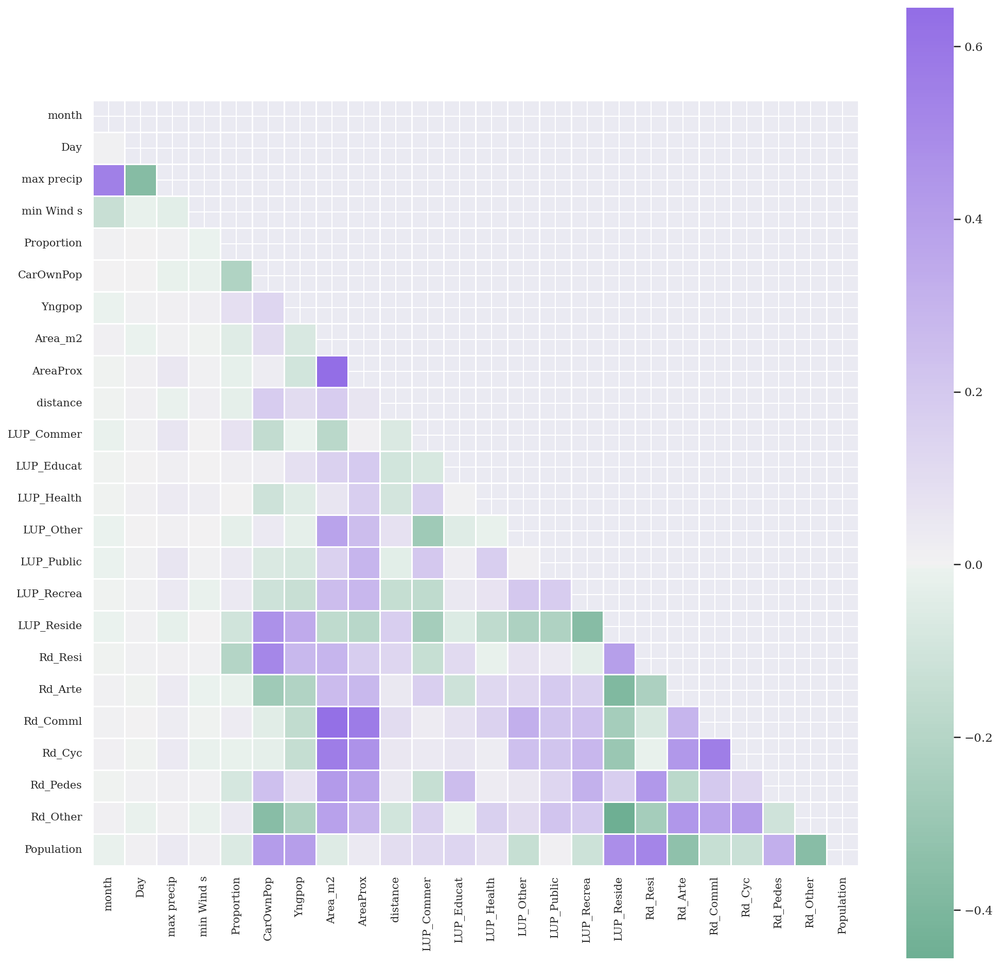

In [11]:
# Features to remove for better correlation (< 70% )
# sorted_feature_names.remove('avg temp')
# sorted_feature_names.remove('avg precip')
# sorted_feature_names.remove('max temp')
# sorted_feature_names.remove('avg Wind speed')

features_1 = sorted_feature_names
corr = data[features_1].corr('spearman')
mask = np.triu(np.ones_like(corr, dtype=bool))
f, ax = plt.subplots(figsize=(16, 16))
cmap = sns.diverging_palette(150, 275, s=80, l=55, n=9, as_cmap=True)
g = sns.heatmap(corr, mask=mask, cmap=cmap, vmax=None, center=0,square=True,linewidths=.5, cbar_kws={"shrink": 1})
g.set_xticklabels(g.get_xmajorticklabels(), fontsize = 10)
g.set_yticklabels(g.get_ymajorticklabels(), fontsize = 10)

In [12]:
sorted_feature_names = vif_data[vif_data['VIF'] < 20]['feature']
features_1=sorted_feature_names
print(len(features_1))
col_test = df[sorted_feature_names]
df.replace([np.inf, -np.inf, np.nan], 0, inplace=True)
vif_data = pd.DataFrame()
vif_data["feature"] = col_test.columns
vif_data["VIF"] = [variance_inflation_factor(col_test.values.astype(float), i)
                          for i in range(len(col_test.columns))]

vif_data = vif_data.sort_values(by="VIF", ascending=False)
print(vif_data.to_string(index=False, float_format='%.2f'))

23
   feature   VIF
min Wind s 16.51
   Area_m2  9.80
 CarOwnPop  7.76
  Rd_Pedes  7.54
    Yngpop  6.95
LUP_Reside  6.21
LUP_Commer  5.00
Proportion  4.99
Population  4.89
max precip  4.69
     month  4.34
    Rd_Cyc  3.86
LUP_Recrea  3.54
   Rd_Resi  3.38
  Rd_Comml  3.13
 LUP_Other  3.08
  AreaProx  2.92
  Rd_Other  2.58
       Day  2.25
   Rd_Arte  1.98
LUP_Public  1.72
LUP_Educat  1.69
LUP_Health  1.33


In [13]:
features_1 = features_1.tolist()
columns_to_select = features_1 + ['count_trip', 'x', 'y','BASOMRÅDE','geometry']
df = data[columns_to_select]
df.head(2)

,month,Day,max precip,min Wind s,Proportion,CarOwnPop,Yngpop,Area_m2,AreaProx,LUP_Commer,LUP_Educat,LUP_Health,LUP_Other,LUP_Public,LUP_Recrea,LUP_Reside,Rd_Resi,Rd_Arte,Rd_Comml,Rd_Cyc,Rd_Pedes,Rd_Other,Population,count_trip,x,y,BASOMRÅDE,geometry
0,1,0,1.363333,1.5900,0.059934,0.19943,0.344729,72488.5,0.382295,0.433173,0.0,0.0,0.09274,0.387015,0.0,0.087072,186.489991,2166.617857,1323.043464,681.868716,963.726336,6.579349,351.0,5.850,144669.155907,6.396644e+06,10101,"POLYGON Z ((144590.135 6396532.436 0.000, 1445..."
1,1,1,0.175000,1.7875,0.059934,0.19943,0.344729,72488.5,0.382295,0.433173,0.0,0.0,0.09274,0.387015,0.0,0.087072,186.489991,2166.617857,1323.043464,681.868716,963.726336,6.579349,351.0,4.125,144669.155907,6.396644e+06,10101,"POLYGON Z ((144590.135 6396532.436 0.000, 1445..."


In [14]:
X = df[features_1].values
y = df['count_trip'].values.reshape((-1,1))
u = df['x']
v = df['y']
coords = list(zip(u,v))
print(X.shape, y.shape)

(2595, 23) (2595, 1)


In [15]:
global_model = LinearRegression()
global_model.fit(X, y) 
global_predicted_values = global_model.predict(X)
global_mse = mean_squared_error(y, global_predicted_values)
global_mae = mean_absolute_error(y, global_predicted_values)
global_r2 = r2_score(y, global_predicted_values)

print("Global Regression MSE:", global_mse)
print("Global Regression MAE:", global_mae)
print("Global Regression R-squared:", global_r2)

Global Regression MSE: 155.52065102356406
Global Regression MAE: 7.001389517950527
Global Regression R-squared: 0.4016134104591663


# GWR model

In [16]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
print(X_scaled.shape, y.shape)
print("Optimizing bandwidth for the GWR model...")
start_time = time.time()
gwr_selector = Sel_BW(coords, y, X_scaled)
gwr_bw = gwr_selector.search()
end_time = time.time()
print(f"Time taken for feature selection: {end_time - start_time:.2f} seconds")
print('GWR bandwidth =', gwr_bw)

(2595, 23) (2595, 1)
Optimizing bandwidth for the GWR model...
Time taken for feature selection: 267.65 seconds
GWR bandwidth = 144.0


In [17]:
# Optimizing feature selection for accuracy criteria (AIC)
num_covariates = X_scaled.shape[1]

selected_features = []
print("Selecting features using a stepped regression...")
start_time = time.time()

for i in range(num_covariates):
    best_aic = float('inf')
    best_feature = None
    
    for j in range(num_covariates):
        if j not in selected_features:
            current_features = selected_features + [j]
            X_current = X_scaled[:, current_features]
            
            model = sm.OLS(y, X_current).fit()
            current_aic = model.aic
            
            if current_aic < best_aic:
                best_aic = current_aic
                best_feature = j
                
    if best_feature is not None:
        selected_features.append(best_feature)
        
        selected_X = X_scaled[:, selected_features]
        gwr_results = GWR(coords, y, selected_X, gwr_bw).fit()
        
end_time = time.time()
print(f"Time taken for feature selection: {end_time - start_time:.2f} seconds")
feature_names = df.columns.drop(['count_trip', 'BASOMRÅDE', 'x', 'y', 'geometry'])
selected_feature_names = [feature_names[i] for i in selected_features]
print("Selected feature names:", selected_feature_names)

Selecting features using a stepped regression...
Time taken for feature selection: 631.54 seconds
Selected feature names: ['AreaProx', 'LUP_Commer', 'month', 'Rd_Comml', 'LUP_Public', 'Rd_Arte', 'LUP_Recrea', 'Day', 'Rd_Pedes', 'Area_m2', 'Rd_Cyc', 'CarOwnPop', 'Rd_Other', 'Proportion', 'max precip', 'Yngpop', 'Population', 'LUP_Health', 'LUP_Reside', 'min Wind s', 'Rd_Resi', 'LUP_Other', 'LUP_Educat']


In [18]:
start_time = time.time()
print("Current time:", datetime.now())

try:
    print("Starting GWR fitting...")
    gwr_results = GWR(coords, y, X_scaled, gwr_bw).fit()
    end_time = time.time()
    print(f"Time taken for GWR fitting: {end_time - start_time:.2f} seconds")
    num_observations = gwr_results.n
    print("Number of observations:", num_observations)
    print("GWR Summary:")
    gwr_summary = gwr_results.summary()
    print(gwr_summary)

except Exception as e:
    print("Error encountered:", e)
    end_time = time.time()
    print(f"Time elapsed before error: {end_time - start_time:.2f} seconds")

Current time: 2024-01-21 03:43:16.025902
Starting GWR fitting...
Time taken for GWR fitting: 52.20 seconds
Number of observations: 2595
GWR Summary:
Model type                                                         Gaussian
Number of observations:                                                2595
Number of covariates:                                                    24

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                         403576.089
Log-likelihood:                                                  -10230.341
AIC:                                                              20508.681
AICc:                                                             20511.187
BIC:                                                             383364.580
R2:                                                                   0.402
Adj. R2:                                                        

In [19]:
predicted_values = gwr_results.predy
actual_values = y
df['gwr_R2'] = gwr_results.localR2

mse = mean_squared_error(actual_values, predicted_values)
mae = mean_absolute_error(actual_values, predicted_values)
rmse = mse ** 0.5

print("Mean Squared Error:", mse)
print("Mean Absolute Error:", mae)
print("Root Mean Squared Error:", rmse)
print('R2 =', gwr_results.R2)
print('AIC =', gwr_results.aic)
print('AICc =', gwr_results.aicc)
print('BIC =', gwr_results.bic)

Mean Squared Error: 25.1357475340393
Mean Absolute Error: 2.0808205417507897
Root Mean Squared Error: 5.013556375871254
R2 = 0.9032868359059644
AIC = 17007.12890125567
AICc = 17423.83182436294
BIC = 20746.086662556954


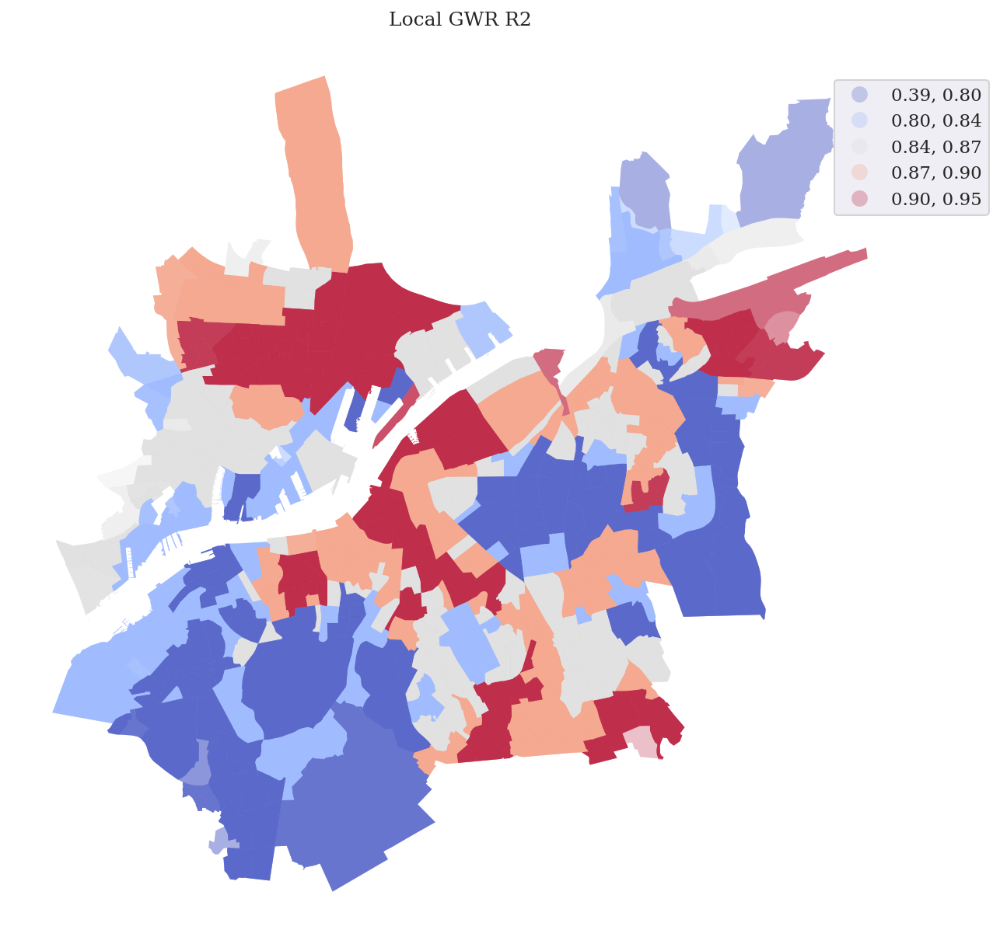

In [20]:
fig, ax = plt.subplots(figsize=(10, 10))
df.plot(column='gwr_R2', cmap = 'coolwarm', linewidth=0.01, scheme = 'quantiles', k=5, legend=True, 
         legend_kwds={'bbox_to_anchor':(1.10, 0.96)},  ax=ax, alpha=0.25)
ax.set_title('Local GWR R2', fontsize=12)
ax.axis("off")
plt.savefig('GWR_R2.png',dpi=150, bbox_inches='tight')
plt.show()

In [21]:
for i, feature in enumerate(features_1):   df[f'gwr_{feature}'] = gwr_results.params[:, i].round(2)
df.head()

,month,Day,max precip,min Wind s,Proportion,CarOwnPop,Yngpop,Area_m2,AreaProx,LUP_Commer,LUP_Educat,LUP_Health,LUP_Other,LUP_Public,LUP_Recrea,LUP_Reside,Rd_Resi,Rd_Arte,Rd_Comml,Rd_Cyc,Rd_Pedes,Rd_Other,Population,count_trip,x,y,BASOMRÅDE,geometry,gwr_R2,gwr_month,gwr_Day,gwr_max precip,gwr_min Wind s,gwr_Proportion,gwr_CarOwnPop,gwr_Yngpop,gwr_Area_m2,gwr_AreaProx,gwr_LUP_Commer,gwr_LUP_Educat,gwr_LUP_Health,gwr_LUP_Other,gwr_LUP_Public,gwr_LUP_Recrea,gwr_LUP_Reside,gwr_Rd_Resi,gwr_Rd_Arte,gwr_Rd_Comml,gwr_Rd_Cyc,gwr_Rd_Pedes,gwr_Rd_Other,gwr_Population
0,1,0,1.363333,1.590000,0.059934,0.19943,0.344729,72488.5,0.382295,0.433173,0.0,0.0,0.09274,0.387015,0.0,0.087072,186.489991,2166.617857,1323.043464,681.868716,963.726336,6.579349,351.0,5.850000,144669.155907,6.396644e+06,10101,"POLYGON Z ((144590.135 6396532.436 0.000, 1445...",0.831261,5.22,0.93,-0.24,0.08,-0.07,-0.13,1.0,1.67,3.85,-2.68,1.31,0.13,1.03,0.57,0.47,0.58,0.87,-0.31,-0.38,3.0,0.82,3.01,1.24
1,1,1,0.175000,1.787500,0.059934,0.19943,0.344729,72488.5,0.382295,0.433173,0.0,0.0,0.09274,0.387015,0.0,0.087072,186.489991,2166.617857,1323.043464,681.868716,963.726336,6.579349,351.0,4.125000,144669.155907,6.396644e+06,10101,"POLYGON Z ((144590.135 6396532.436 0.000, 1445...",0.831261,5.22,0.93,-0.24,0.08,-0.07,-0.13,1.0,1.67,3.85,-2.68,1.31,0.13,1.03,0.57,0.47,0.58,0.87,-0.31,-0.38,3.0,0.82,3.01,1.24
2,2,0,0.835000,2.255000,0.059934,0.19943,0.344729,72488.5,0.382295,0.433173,0.0,0.0,0.09274,0.387015,0.0,0.087072,186.489991,2166.617857,1323.043464,681.868716,963.726336,6.579349,351.0,8.766667,144669.155907,6.396644e+06,10101,"POLYGON Z ((144590.135 6396532.436 0.000, 1445...",0.831261,5.22,0.93,-0.24,0.08,-0.07,-0.13,1.0,1.67,3.85,-2.68,1.31,0.13,1.03,0.57,0.47,0.58,0.87,-0.31,-0.38,3.0,0.82,3.01,1.24
3,2,1,1.207500,2.440000,0.059934,0.19943,0.344729,72488.5,0.382295,0.433173,0.0,0.0,0.09274,0.387015,0.0,0.087072,186.489991,2166.617857,1323.043464,681.868716,963.726336,6.579349,351.0,7.150000,144669.155907,6.396644e+06,10101,"POLYGON Z ((144590.135 6396532.436 0.000, 1445...",0.831261,5.22,0.93,-0.24,0.08,-0.07,-0.13,1.0,1.67,3.85,-2.68,1.31,0.13,1.03,0.57,0.47,0.58,0.87,-0.31,-0.38,3.0,0.82,3.01,1.24
4,0,0,0.296667,2.493333,0.059934,0.19943,0.344729,72488.5,0.382295,0.433173,0.0,0.0,0.09274,0.387015,0.0,0.087072,186.489991,2166.617857,1323.043464,681.868716,963.726336,6.579349,351.0,3.833333,144669.155907,6.396644e+06,10101,"POLYGON Z ((144590.135 6396532.436 0.000, 1445...",0.831261,5.22,0.93,-0.24,0.08,-0.07,-0.13,1.0,1.67,3.85,-2.68,1.31,0.13,1.03,0.57,0.47,0.58,0.87,-0.31,-0.38,3.0,0.82,3.01,1.24


In [22]:
# Filter t-values: standard alpha = 0.05
gwr_filtered_t = gwr_results.filter_tvals(alpha = 0.05)
# Filter t-values: corrected alpha due to multiple testing
gwr_filtered_tc = gwr_results.filter_tvals()
df.columns

Index(['month', 'Day', 'max precip', 'min Wind s', 'Proportion', 'CarOwnPop',
       'Yngpop', 'Area_m2', 'AreaProx', 'LUP_Commer', 'LUP_Educat',
       'LUP_Health', 'LUP_Other', 'LUP_Public', 'LUP_Recrea', 'LUP_Reside',
       'Rd_Resi', 'Rd_Arte', 'Rd_Comml', 'Rd_Cyc', 'Rd_Pedes', 'Rd_Other',
       'Population', 'count_trip', 'x', 'y', 'BASOMRÅDE', 'geometry', 'gwr_R2',
       'gwr_month', 'gwr_Day', 'gwr_max precip', 'gwr_min Wind s',
       'gwr_Proportion', 'gwr_CarOwnPop', 'gwr_Yngpop', 'gwr_Area_m2',
       'gwr_AreaProx', 'gwr_LUP_Commer', 'gwr_LUP_Educat', 'gwr_LUP_Health',
       'gwr_LUP_Other', 'gwr_LUP_Public', 'gwr_LUP_Recrea', 'gwr_LUP_Reside',
       'gwr_Rd_Resi', 'gwr_Rd_Arte', 'gwr_Rd_Comml', 'gwr_Rd_Cyc',
       'gwr_Rd_Pedes', 'gwr_Rd_Other', 'gwr_Population'],
      dtype='object')

In [23]:
# Since the coefficients are the same for 'BASOMRÅDE', we group and aggregate temporal data.
df_gwr = df.drop(columns=['x', 'y'])
numeric_cols = df_gwr.select_dtypes(include=['number']).columns
df_gwr_numeric = df_gwr.groupby('BASOMRÅDE')[numeric_cols].mean()
df_geometry = df_gwr.drop_duplicates('BASOMRÅDE')[['BASOMRÅDE', 'geometry']].set_index('BASOMRÅDE')
df_gwr = df_gwr_numeric.merge(df_geometry, left_index=True, right_index=True)
df_gwr = gpd.GeoDataFrame(df_gwr, geometry='geometry')
df_gwr.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 453 entries, 10101 to 70902
Data columns (total 50 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   month           453 non-null    float64 
 1   Day             453 non-null    float64 
 2   max precip      453 non-null    float64 
 3   min Wind s      453 non-null    float64 
 4   Proportion      453 non-null    float64 
 5   CarOwnPop       453 non-null    float64 
 6   Yngpop          453 non-null    float64 
 7   Area_m2         453 non-null    float64 
 8   AreaProx        453 non-null    float64 
 9   LUP_Commer      453 non-null    float64 
 10  LUP_Educat      453 non-null    float64 
 11  LUP_Health      453 non-null    float64 
 12  LUP_Other       453 non-null    float64 
 13  LUP_Public      453 non-null    float64 
 14  LUP_Recrea      453 non-null    float64 
 15  LUP_Reside      453 non-null    float64 
 16  Rd_Resi         453 non-null    float64 
 17  Rd_Arte

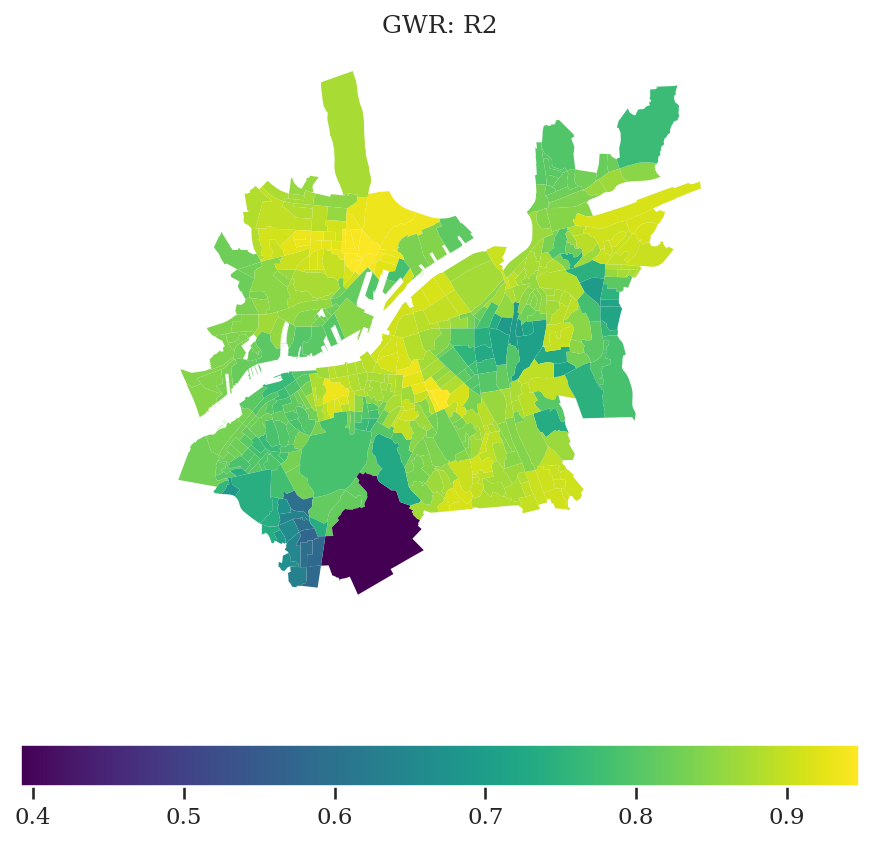

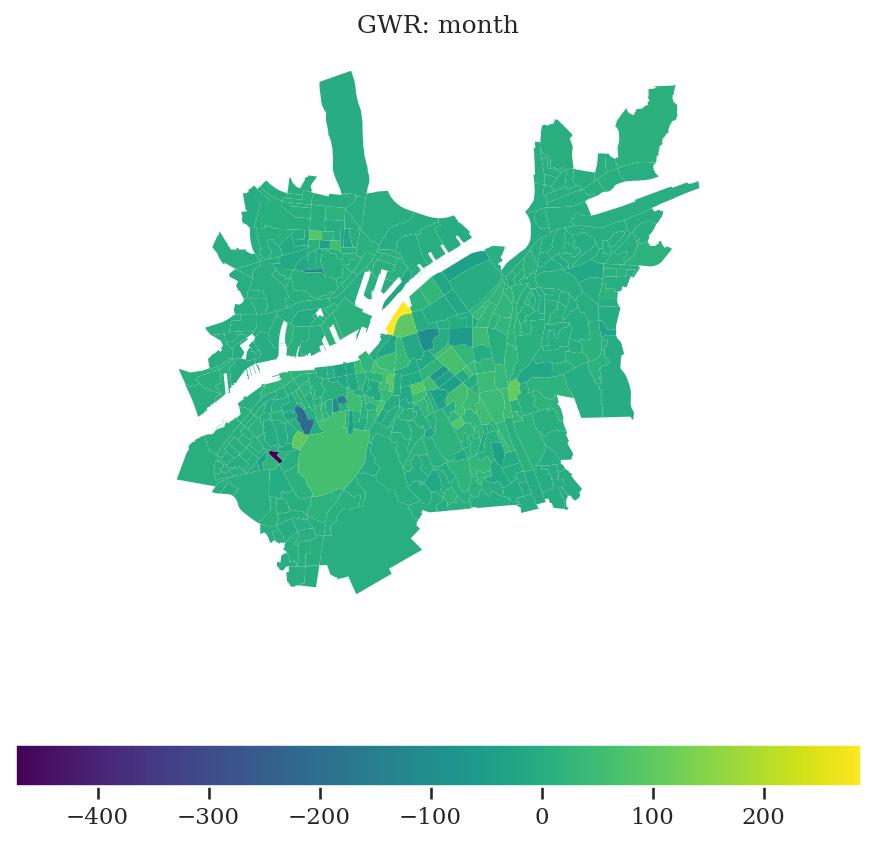

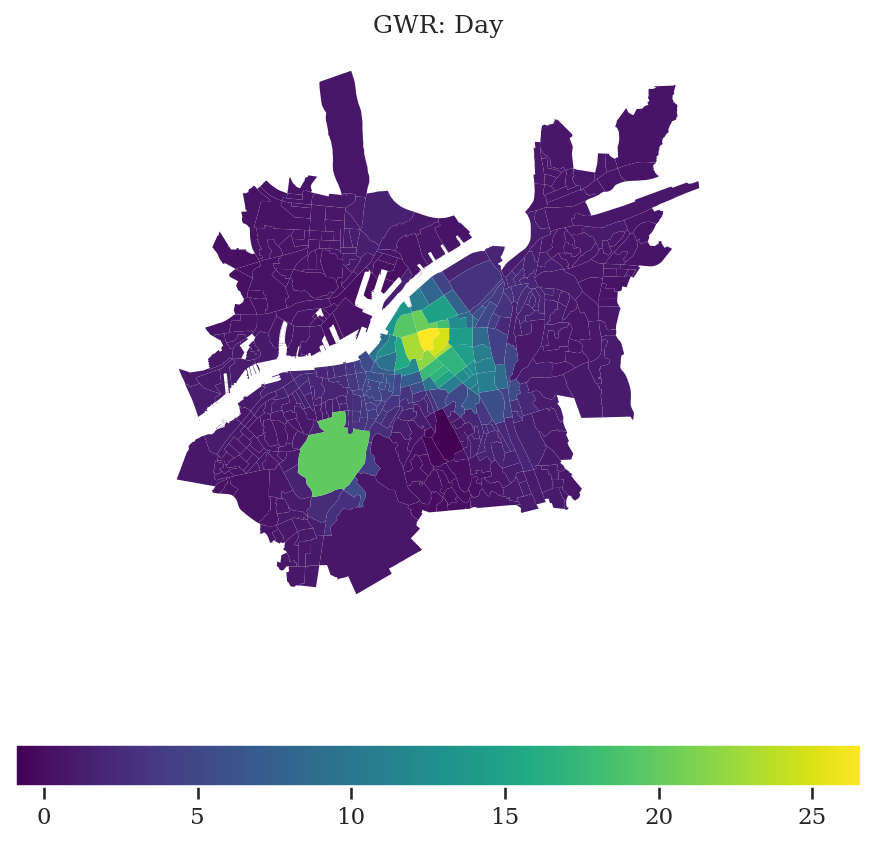

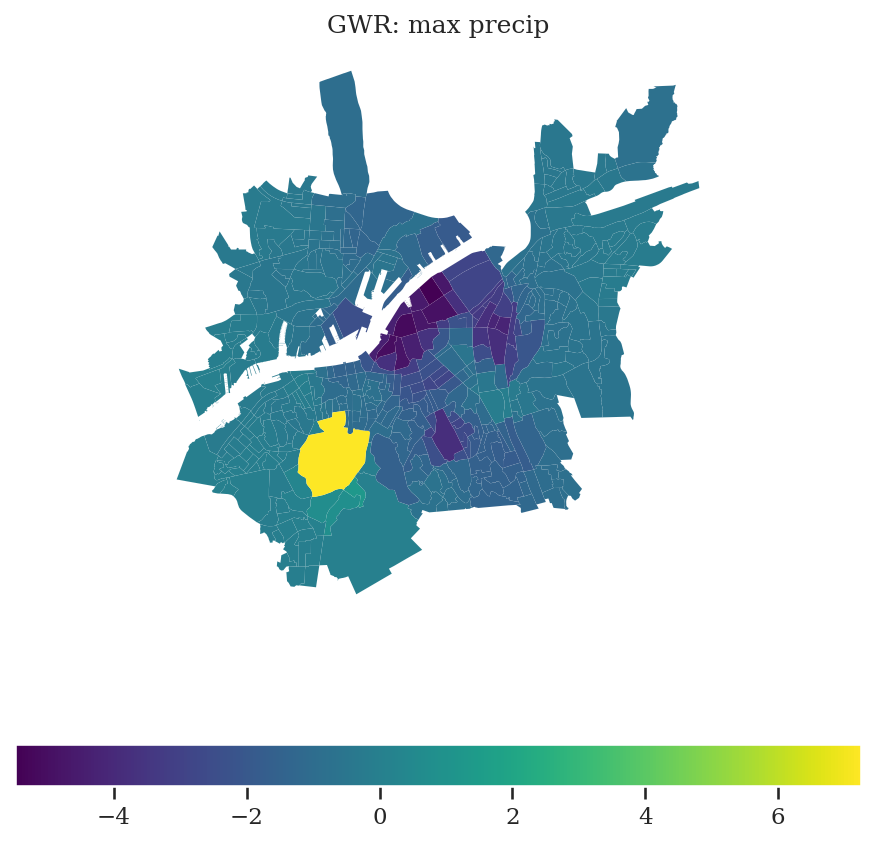

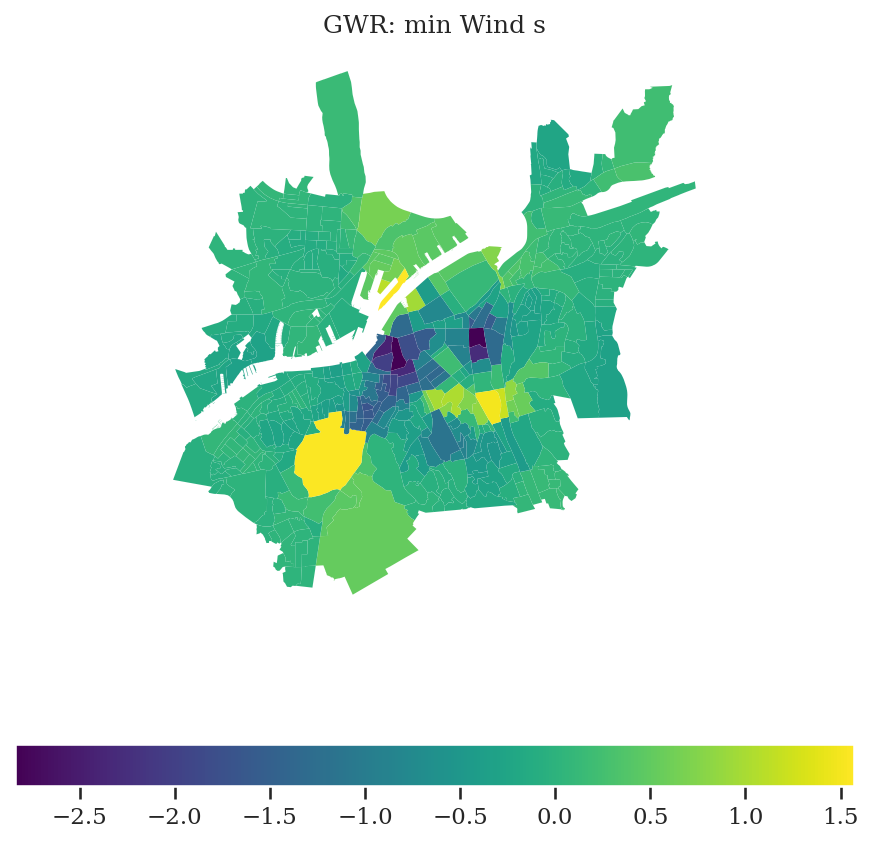

...

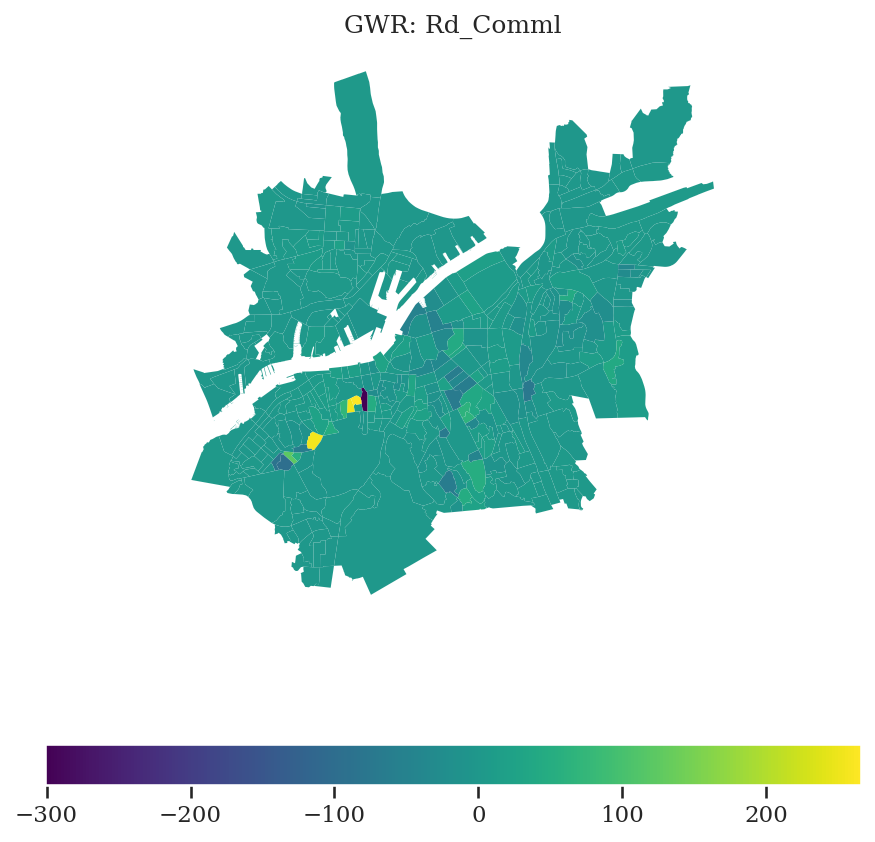

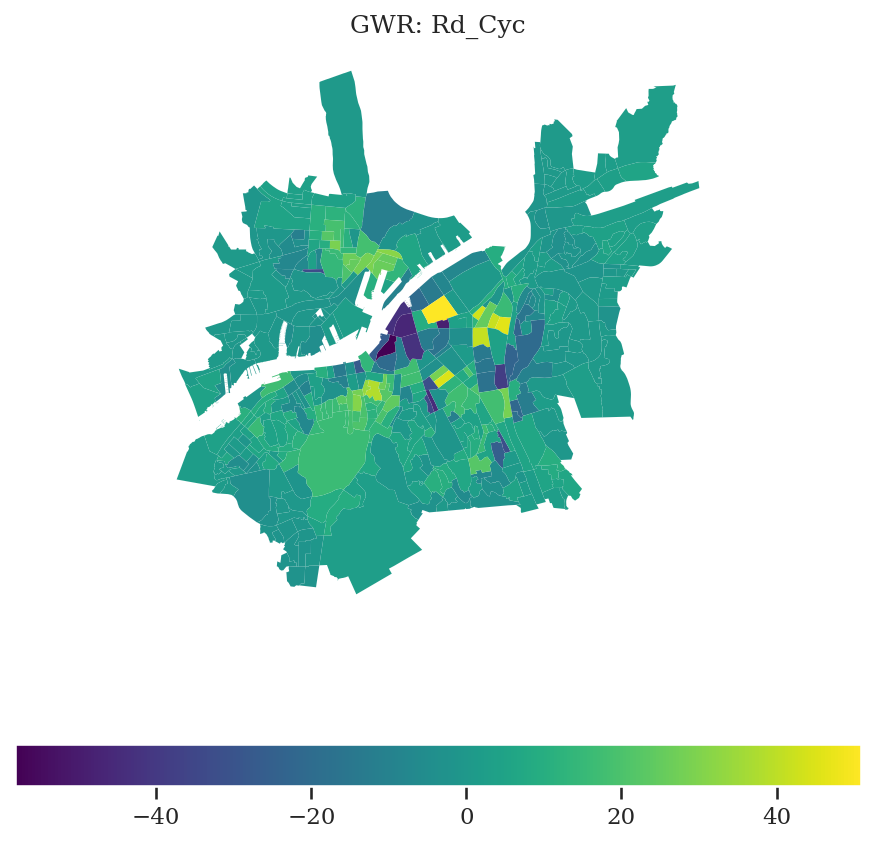

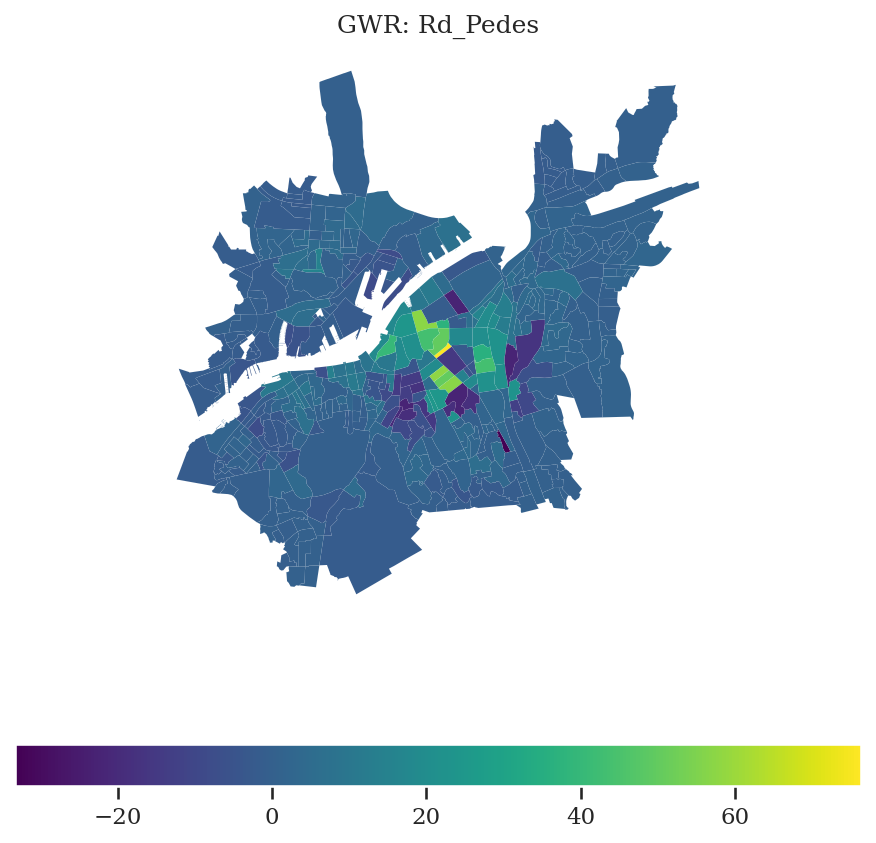

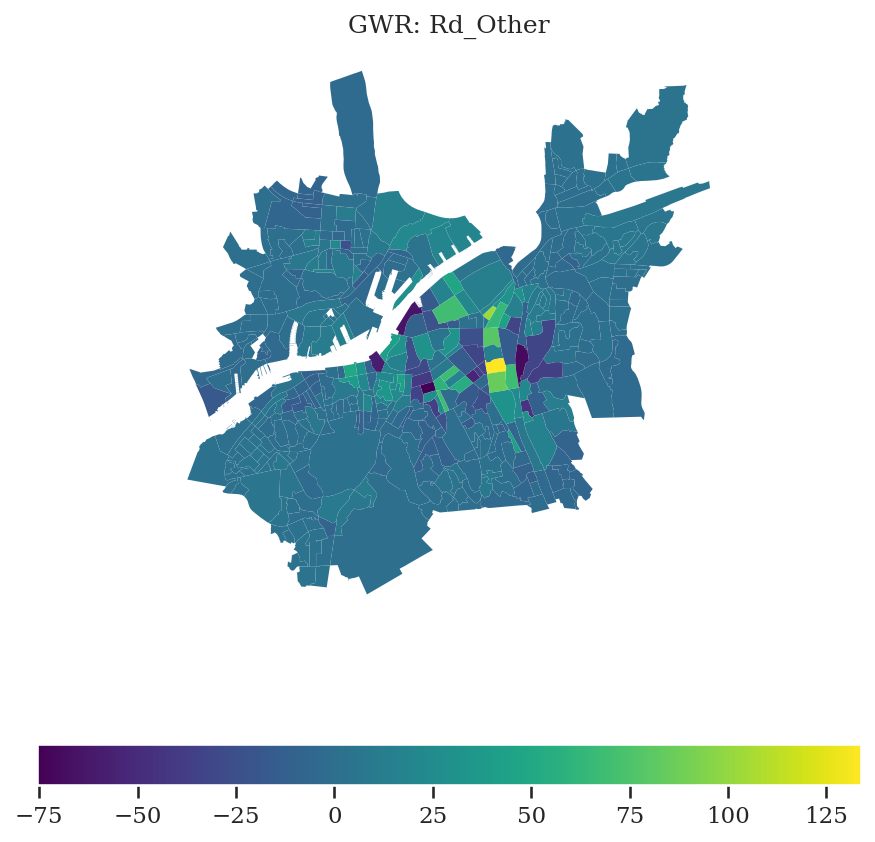

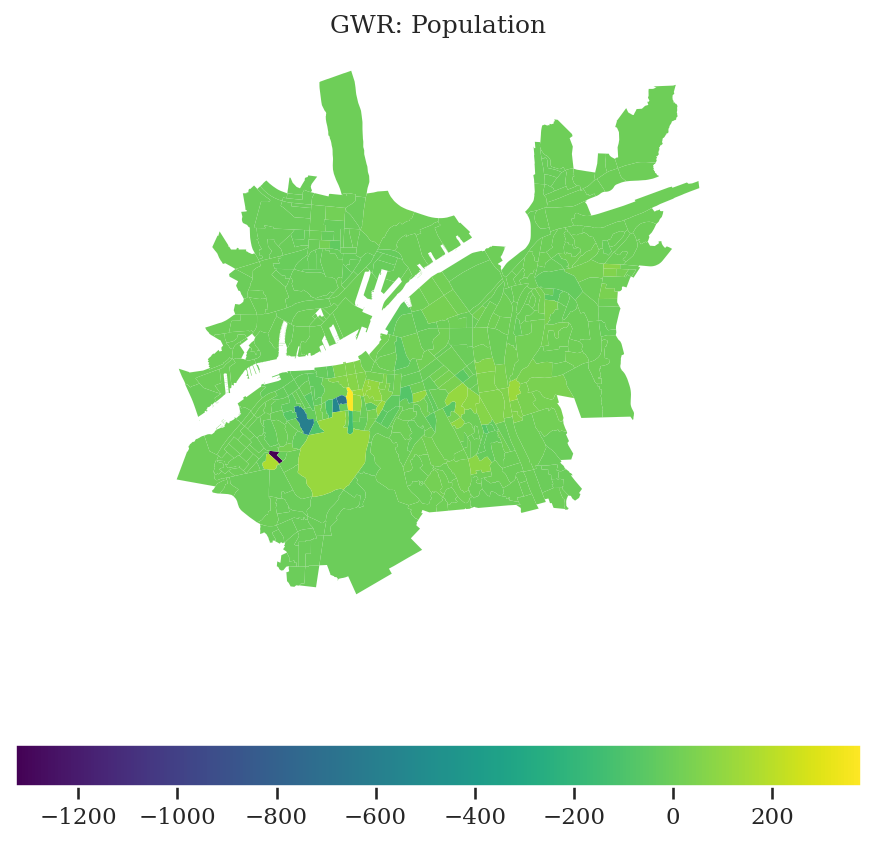

In [24]:
gwr_coefficient_cols = [col for col in df_gwr.columns if col.startswith('gwr_')]

for coeff_col in gwr_coefficient_cols:
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    cmap = 'viridis'
    df_gwr.plot(column=coeff_col, cmap=cmap, linewidth=0.01, 
                legend=True, legend_kwds={'orientation': 'horizontal'},ax=ax)
    plt.tight_layout()
    ax.axis("off")
    feature_name = coeff_col.replace('gwr_', '')
    ax.set_title(f'GWR: {feature_name}', fontsize=12)
    plt.savefig(f'GWR_{feature_name}.png', dpi=150, bbox_inches='tight')
    plt.show()

# MGWR model

In [25]:
df = df.dropna()
y = df['count_trip'].values.reshape(-1, 1)
X = df[['AreaProx', 'LUP_Commer', 'month', 'Rd_Comml', 'LUP_Public', 'Rd_Arte', 'LUP_Recrea', 'Day', 'Rd_Pedes', 'Area_m2', 'Rd_Cyc', 'CarOwnPop', 
        'Rd_Other', 'Proportion', 'max precip', 'Yngpop', 'Population', 'LUP_Health', 'LUP_Reside', 'min Wind s', 'Rd_Resi', 'LUP_Other', 'LUP_Educat']] 
Zy = (y - y.mean(axis=0)) / y.std(axis=0)
ZX = (X - X.mean(axis=0)) / X.std(axis=0)
coords = df[['x', 'y']].values
df.columns

Index(['month', 'Day', 'max precip', 'min Wind s', 'Proportion', 'CarOwnPop',
       'Yngpop', 'Area_m2', 'AreaProx', 'LUP_Commer', 'LUP_Educat',
       'LUP_Health', 'LUP_Other', 'LUP_Public', 'LUP_Recrea', 'LUP_Reside',
       'Rd_Resi', 'Rd_Arte', 'Rd_Comml', 'Rd_Cyc', 'Rd_Pedes', 'Rd_Other',
       'Population', 'count_trip', 'x', 'y', 'BASOMRÅDE', 'geometry', 'gwr_R2',
       'gwr_month', 'gwr_Day', 'gwr_max precip', 'gwr_min Wind s',
       'gwr_Proportion', 'gwr_CarOwnPop', 'gwr_Yngpop', 'gwr_Area_m2',
       'gwr_AreaProx', 'gwr_LUP_Commer', 'gwr_LUP_Educat', 'gwr_LUP_Health',
       'gwr_LUP_Other', 'gwr_LUP_Public', 'gwr_LUP_Recrea', 'gwr_LUP_Reside',
       'gwr_Rd_Resi', 'gwr_Rd_Arte', 'gwr_Rd_Comml', 'gwr_Rd_Cyc',
       'gwr_Rd_Pedes', 'gwr_Rd_Other', 'gwr_Population'],
      dtype='object')

In [26]:
# Checking for columns with zero standard deviation
constant_columns = X.columns[X.std(axis=0) == 0]
print("Constant columns:", constant_columns)
# Re-standardize ZX without the constant column
ZX = (X - X.mean(axis=0)) / X.std(axis=0)
ZX = np.nan_to_num(ZX)

Constant columns: Index([], dtype='object')


In [27]:
start_time = time.time()
print("Current time:", datetime.now())
try:
    print("Starting bandwidth selection...")
    mgwr_selector = Sel_BW(coords, Zy, ZX, multi=True)
    mgwr_bw = mgwr_selector.search()
    end_time = time.time()    # Bandwidth search completed..
    print(f"Bandwidth selected: {mgwr_bw}")
    print(f"Time taken for bandwidth selection: {end_time - start_time:.2f} seconds")

except Exception as e:
    print("Error encountered:", e)
    end_time = time.time()
    print(f"Time elapsed before error: {end_time - start_time:.2f} seconds")

Current time: 2024-01-21 03:44:26.855317
Starting bandwidth selection...
Bandwidth selected: [  63.   66.   48.   46.   59.  104.   96.   47.   48.   76.   56.   64.
   75. 2592.  235. 2592.   54. 2592.   52.   76. 1376.   48.   56.   63.]
Time taken for bandwidth selection: 58011.57 seconds


In [28]:
start_time = time.time()
print("Current time:", datetime.now())
try:
    print("Starting MGWR fitting...")
    mgwr_results = MGWR(coords, Zy, ZX, mgwr_selector).fit()
    end_time = time.time()    # MGWR fitting completed
    print(f"Time taken for MGWR fitting: {end_time - start_time:.2f} seconds")
    print("Calculating bandwidth confidence intervals...")
    mgwr_bw_ci = mgwr_results.get_bws_intervals(mgwr_selector)
    print(mgwr_bw_ci)
    print("MGWR Summary:")
    print(mgwr_results.summary())

except Exception as e:
    print("Error encountered:", e)
    end_time = time.time()
    print(f"Time elapsed before error: {end_time - start_time:.2f} seconds")

Current time: 2024-01-21 19:51:18.461198
Starting MGWR fitting...
Time taken for MGWR fitting: 10372.51 seconds
Calculating bandwidth confidence intervals...
[(63.0, 63.0), (63.0, 66.0), (47.0, 48.0), (45.0, 46.0), (55.0, 59.0), (104.0, 104.0), (96.0, 96.0), (47.0, 47.0), (47.0, 48.0), (76.0, 76.0), (55.0, 56.0), (63.0, 65.0), (74.0, 76.0), (1992.0, 2592.0), (218.0, 235.0), (1992.0, 2592.0), (50.0, 54.0), (2223.0, 2592.0), (50.0, 52.0), (76.0, 76.0), (1369.0, 1620.0), (47.0, 48.0), (55.0, 56.0), (63.0, 63.0)]
MGWR Summary:
Model type                                                         Gaussian
Number of observations:                                                2595
Number of covariates:                                                    24

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                           1552.813
Log-likelihood:                                                 

# Map coefficients for MGWR

In [29]:
df['mgwr_intercept'] = mgwr_results.params[:, 0]
df['mgwr_R2'] = mgwr_results.R2
feature_names = X.columns
predicted_values = mgwr_results.predy
actual_values = y

mse = mean_squared_error(actual_values, predicted_values)
mae = mean_absolute_error(actual_values, predicted_values)
rmse = mse ** 0.5

print("Mean Squared Error:", mse)
print("Mean Absolute Error:", mae)
print("Root Mean Squared Error:", rmse)
print('R2 =', mgwr_results.R2)
print('AIC =', mgwr_results.aic)
print('AICc =', mgwr_results.aicc)
print('BIC =', mgwr_results.bic)

Mean Squared Error: 311.8698572045218
Mean Absolute Error: 8.98985933176589
Root Mean Squared Error: 17.659837405948046
R2 = 0.9537652280617871
AIC = 925.3366962308437
AICc = 1574.3848725010362
BIC = 5433.106279829216


In [30]:
for i, feature in enumerate(feature_names, start=1):  # start=1 to skip intercept
    df[f'mgwr_{feature}'] = mgwr_results.params[:, i]

df.columns

Index(['month', 'Day', 'max precip', 'min Wind s', 'Proportion', 'CarOwnPop',
       'Yngpop', 'Area_m2', 'AreaProx', 'LUP_Commer', 'LUP_Educat',
       'LUP_Health', 'LUP_Other', 'LUP_Public', 'LUP_Recrea', 'LUP_Reside',
       'Rd_Resi', 'Rd_Arte', 'Rd_Comml', 'Rd_Cyc', 'Rd_Pedes', 'Rd_Other',
       'Population', 'count_trip', 'x', 'y', 'BASOMRÅDE', 'geometry', 'gwr_R2',
       'gwr_month', 'gwr_Day', 'gwr_max precip', 'gwr_min Wind s',
       'gwr_Proportion', 'gwr_CarOwnPop', 'gwr_Yngpop', 'gwr_Area_m2',
       'gwr_AreaProx', 'gwr_LUP_Commer', 'gwr_LUP_Educat', 'gwr_LUP_Health',
       'gwr_LUP_Other', 'gwr_LUP_Public', 'gwr_LUP_Recrea', 'gwr_LUP_Reside',
       'gwr_Rd_Resi', 'gwr_Rd_Arte', 'gwr_Rd_Comml', 'gwr_Rd_Cyc',
       'gwr_Rd_Pedes', 'gwr_Rd_Other', 'gwr_Population', 'mgwr_intercept',
       'mgwr_R2', 'mgwr_AreaProx', 'mgwr_LUP_Commer', 'mgwr_month',
       'mgwr_Rd_Comml', 'mgwr_LUP_Public', 'mgwr_Rd_Arte', 'mgwr_LUP_Recrea',
       'mgwr_Day', 'mgwr_Rd_Pedes', 'mgwr_

In [31]:
# Filter t-values: standard alpha = 0.05
mgwr_filtered_t = mgwr_results.filter_tvals(alpha = 0.05)

In [32]:
# Since the coefficients are the same for 'BASOMRÅDE', we group and aggregate temporal data.
mgwr_df = df.drop(columns=['x', 'y'])
numeric_cols = mgwr_df.select_dtypes(include=['number']).columns
df_gwr_numeric = mgwr_df.groupby('BASOMRÅDE')[numeric_cols].mean()
df_geometry = mgwr_df.drop_duplicates('BASOMRÅDE')[['BASOMRÅDE', 'geometry']].set_index('BASOMRÅDE')
mgwr_df = df_gwr_numeric.merge(df_geometry, left_index=True, right_index=True)
mgwr_df = gpd.GeoDataFrame(mgwr_df, geometry='geometry')
mgwr_df.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 453 entries, 10101 to 70902
Data columns (total 75 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   month            453 non-null    float64 
 1   Day              453 non-null    float64 
 2   max precip       453 non-null    float64 
 3   min Wind s       453 non-null    float64 
 4   Proportion       453 non-null    float64 
 5   CarOwnPop        453 non-null    float64 
 6   Yngpop           453 non-null    float64 
 7   Area_m2          453 non-null    float64 
 8   AreaProx         453 non-null    float64 
 9   LUP_Commer       453 non-null    float64 
 10  LUP_Educat       453 non-null    float64 
 11  LUP_Health       453 non-null    float64 
 12  LUP_Other        453 non-null    float64 
 13  LUP_Public       453 non-null    float64 
 14  LUP_Recrea       453 non-null    float64 
 15  LUP_Reside       453 non-null    float64 
 16  Rd_Resi          453 non-null    fl

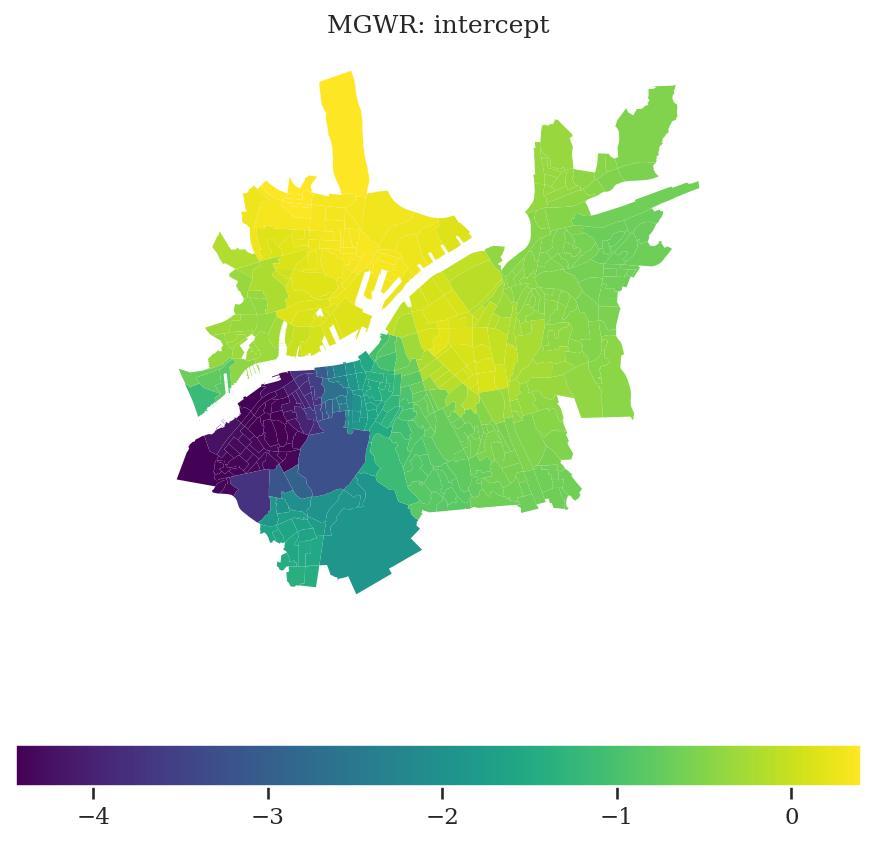

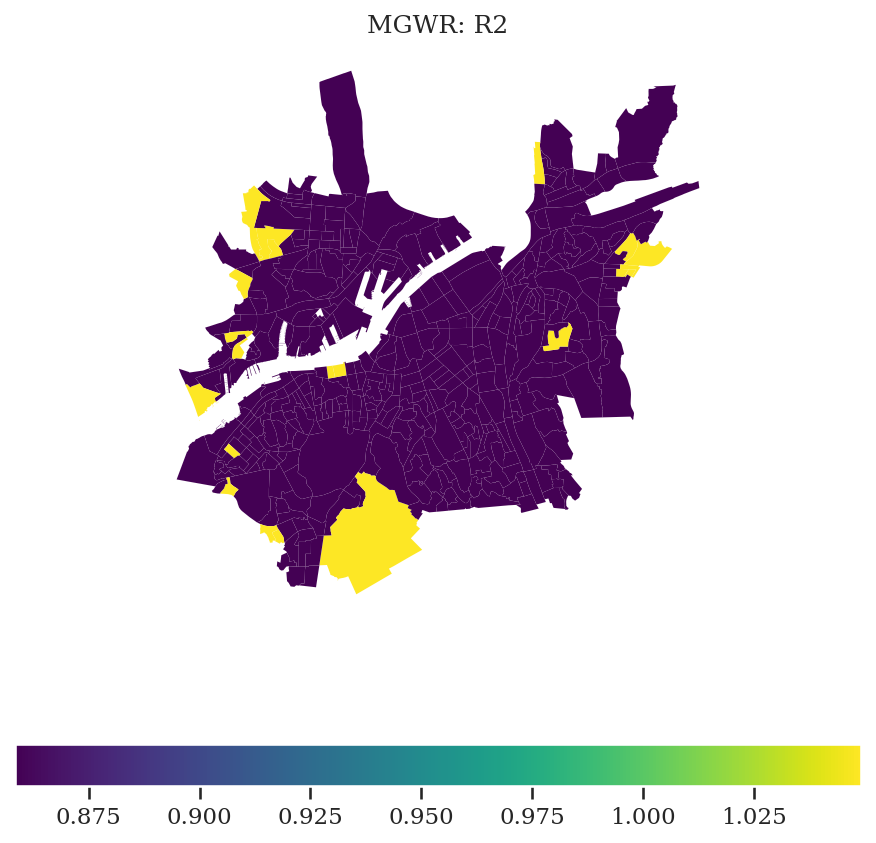

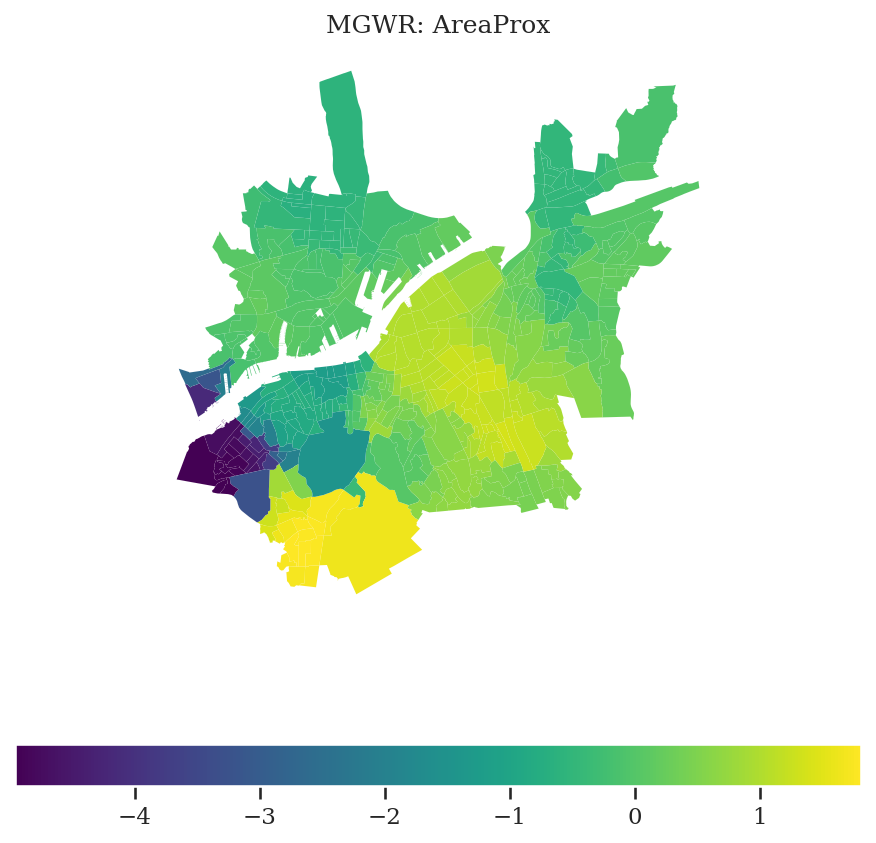

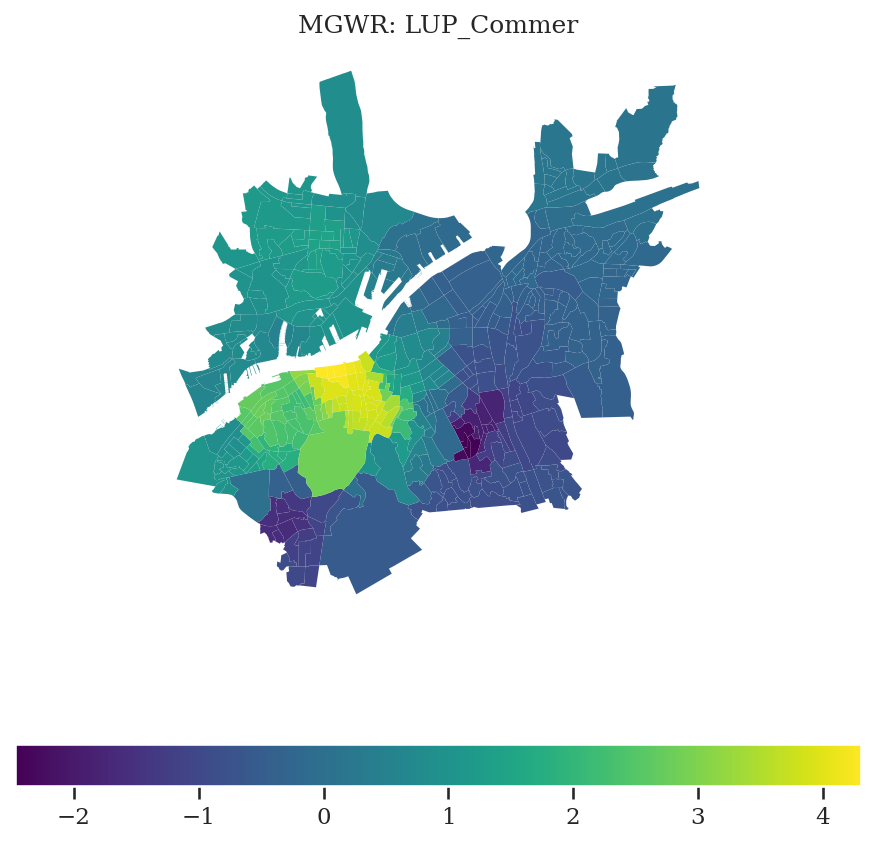

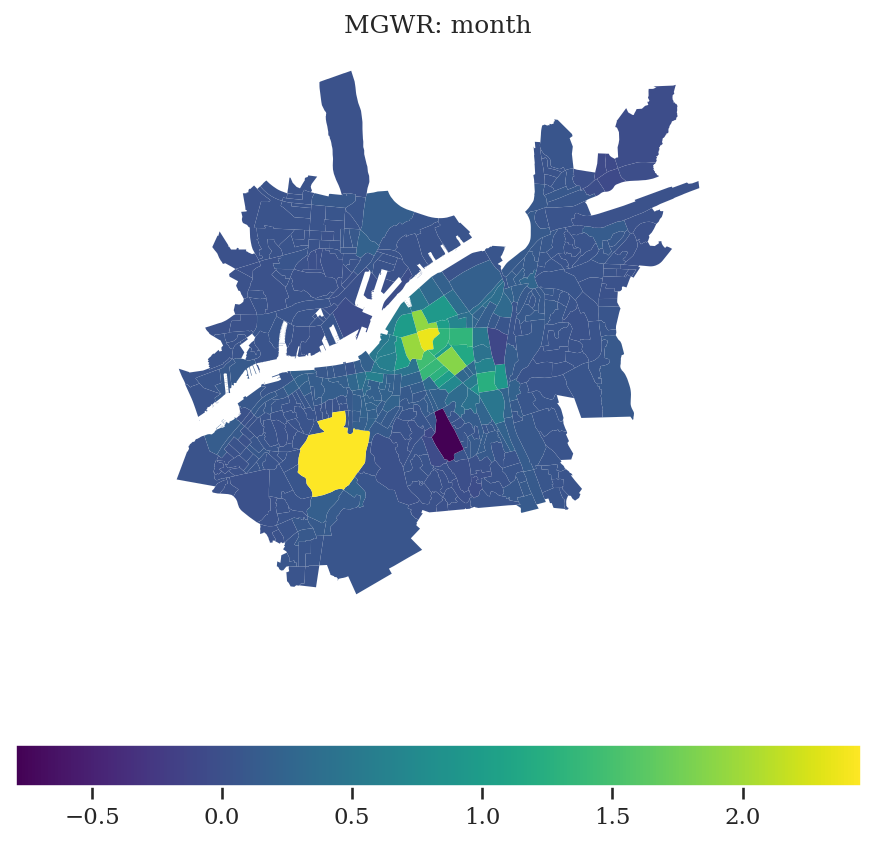

...

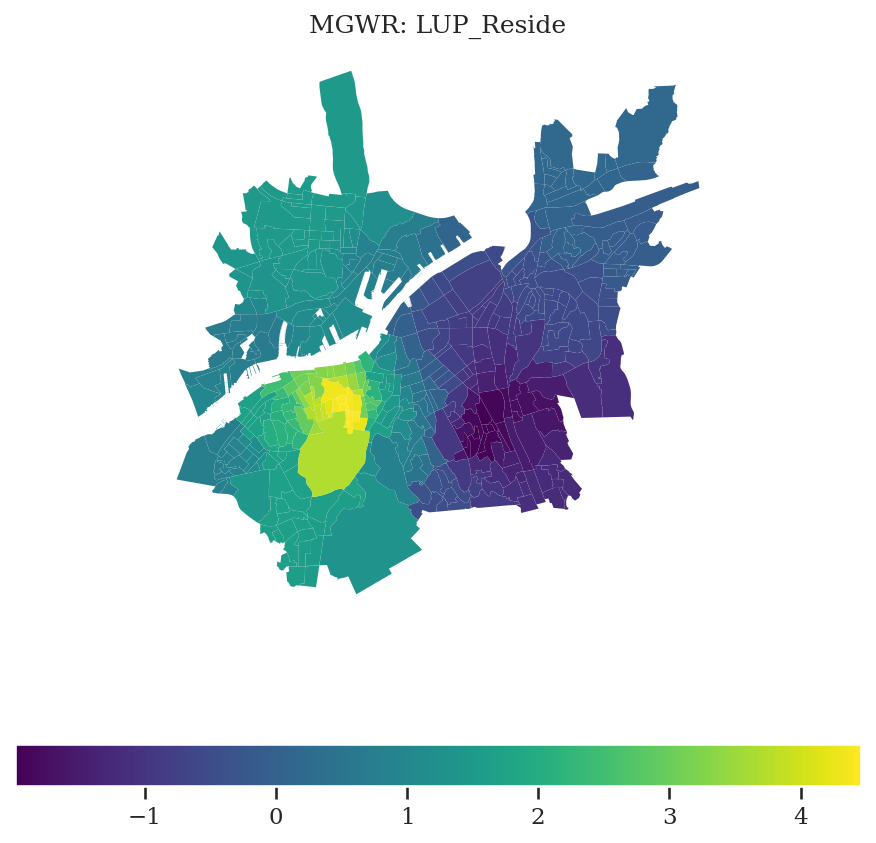

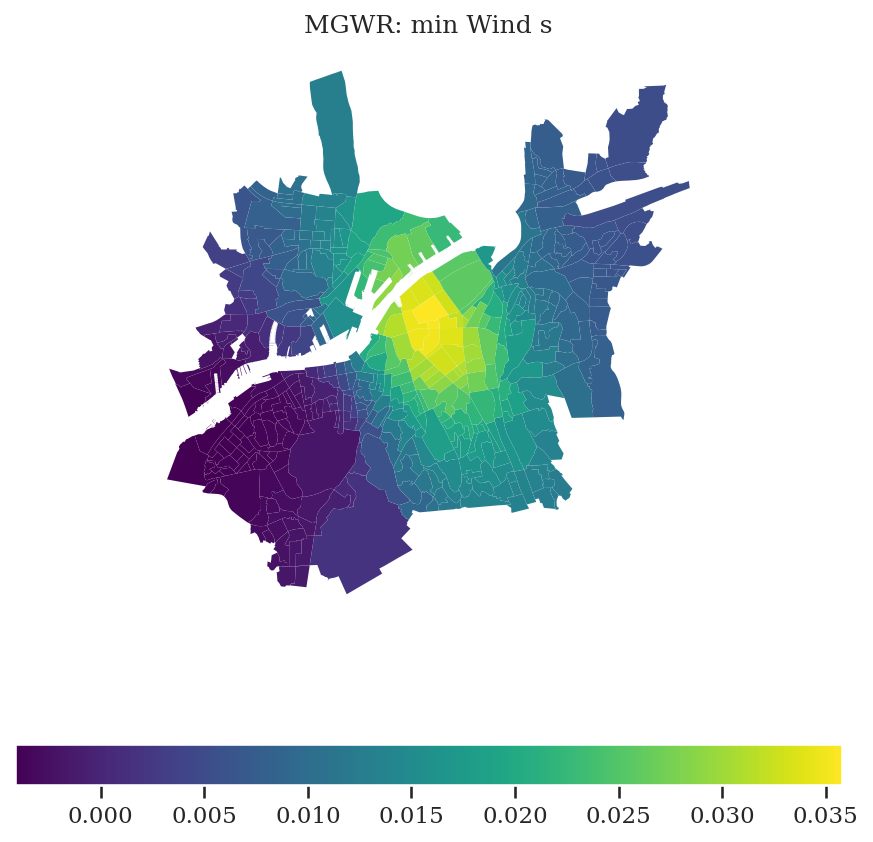

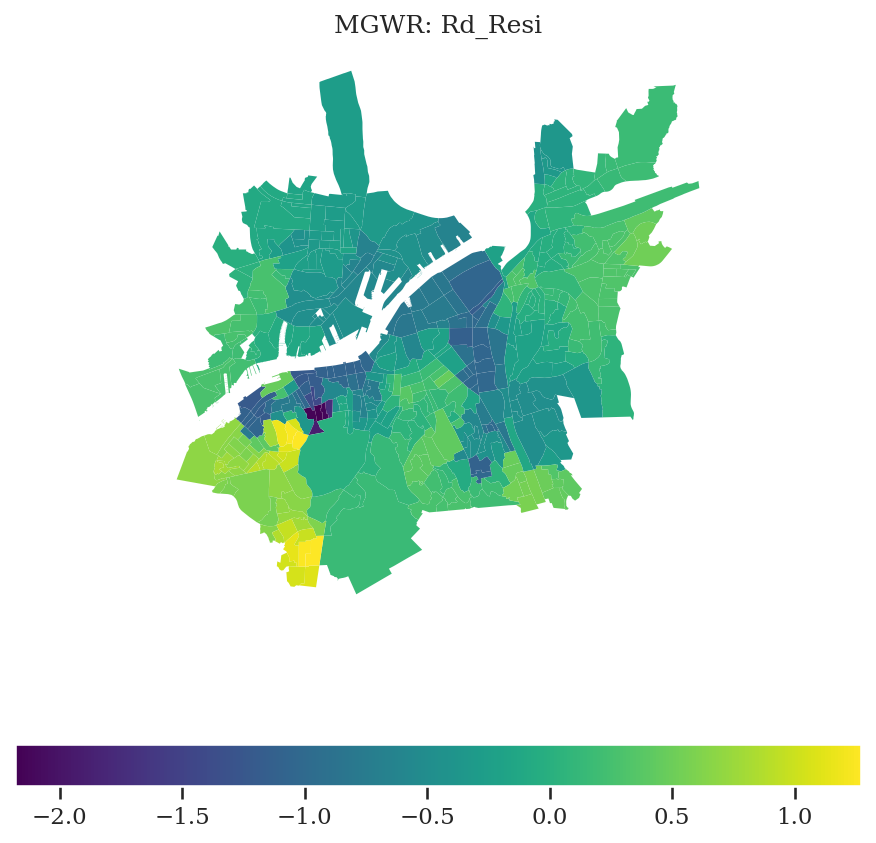

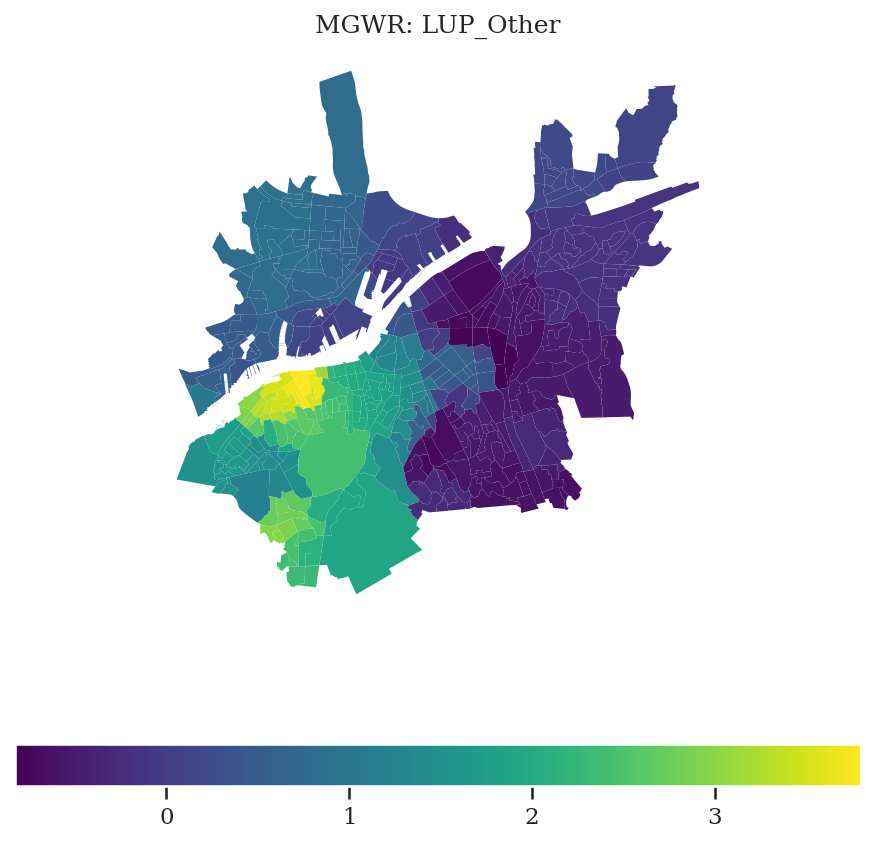

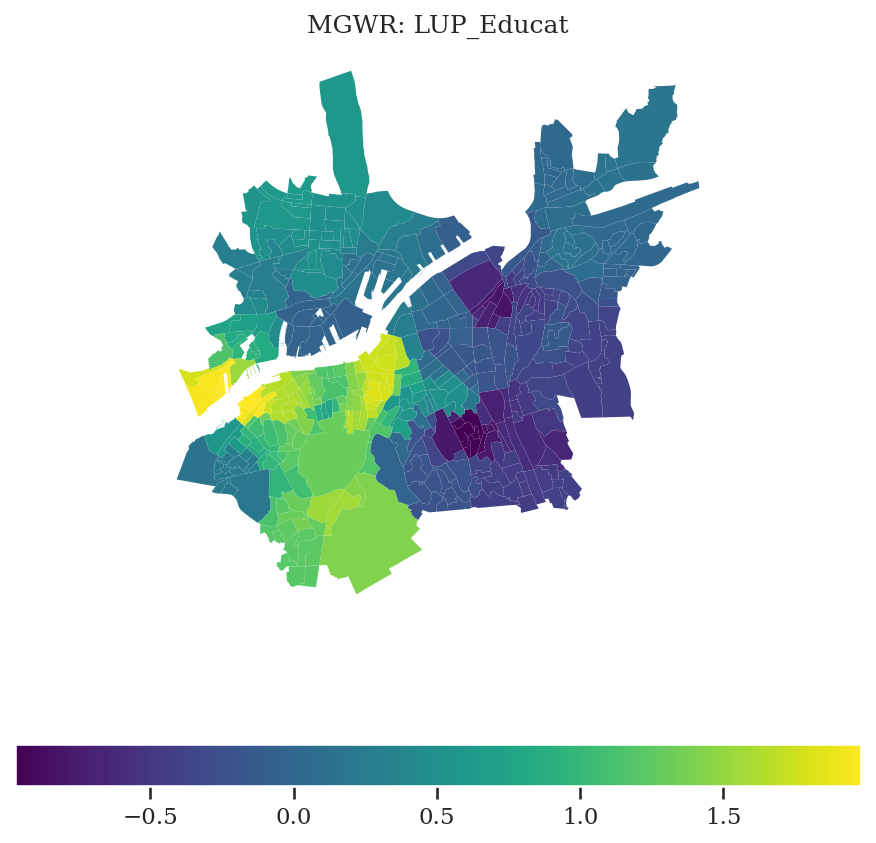

In [33]:
mgwr_coefficient_cols = [col for col in mgwr_df.columns if col.startswith('mgwr_')]

for coeff_col in mgwr_coefficient_cols:
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    cmap = 'viridis'
    mgwr_df.plot(column=coeff_col, cmap=cmap, linewidth=0.01,          # equal interval breaks
                 legend=True, legend_kwds={'orientation': 'horizontal'}, ax=ax)
    plt.tight_layout()
    ax.axis("off")
    feature_name = coeff_col.replace('mgwr_', '')
    ax.set_title(f'MGWR: {feature_name}', fontsize=12)
    plt.savefig(f'MGWR_{feature_name}.png', dpi=150, bbox_inches='tight')
    plt.show()

In [34]:
df.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2595 entries, 0 to 2594
Data columns (total 77 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   month            2595 non-null   int64   
 1   Day              2595 non-null   int32   
 2   max precip       2595 non-null   float64 
 3   min Wind s       2595 non-null   float64 
 4   Proportion       2595 non-null   float64 
 5   CarOwnPop        2595 non-null   float64 
 6   Yngpop           2595 non-null   float64 
 7   Area_m2          2595 non-null   float64 
 8   AreaProx         2595 non-null   float64 
 9   LUP_Commer       2595 non-null   float64 
 10  LUP_Educat       2595 non-null   float64 
 11  LUP_Health       2595 non-null   float64 
 12  LUP_Other        2595 non-null   float64 
 13  LUP_Public       2595 non-null   float64 
 14  LUP_Recrea       2595 non-null   float64 
 15  LUP_Reside       2595 non-null   float64 
 16  Rd_Resi          2595 non-null   f

In [35]:
output_file_path = "C:/Users/omkarp/OneDrive - Chalmers/GOT_attrib.shp"
df.to_file(output_file_path)

# Test spatial stationarity

In [36]:
# Monte Carlo test of spatial variability: 50 iterations 
gwr_p_values_stationarity = gwr_results.spatial_variability(gwr_selector, 50)
gwr_p_values_stationarity # The first p-value is for the intercept

array([0.  , 0.  , 0.  , 0.62, 0.48, 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ,
       0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ,
       0.  , 0.  ])

# Test local multicollinearity

In [37]:
LCC, VIF, CN, VDP = gwr_results.local_collinearity()
pd.DataFrame(VIF)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22
0,1.883672,1.125567,2.034221,1.176199,13.826906,49.927188,47.759980,135.252669,22.779469,2.049114e+16,1.059459e+16,1.219966e+15,2.265962e+16,9.462688e+15,4.068127e+16,3.132702e+16,36.470834,30.414973,201.859780,200.383718,28.976766,48.189273,28.826550
1,1.883672,1.125567,2.034221,1.176199,13.826906,49.927188,47.759980,135.252669,22.779469,2.049114e+16,1.059459e+16,1.219966e+15,2.265962e+16,9.462688e+15,4.068127e+16,3.132702e+16,36.470834,30.414973,201.859780,200.383718,28.976766,48.189273,28.826550
2,1.883672,1.125567,2.034221,1.176199,13.826906,49.927188,47.759980,135.252669,22.779469,2.049114e+16,1.059459e+16,1.219966e+15,2.265962e+16,9.462688e+15,4.068127e+16,3.132702e+16,36.470834,30.414973,201.859780,200.383718,28.976766,48.189273,28.826550
3,1.883672,1.125567,2.034221,1.176199,13.826906,49.927188,47.759980,135.252669,22.779469,2.049114e+16,1.059459e+16,1.219966e+15,2.265962e+16,9.462688e+15,4.068127e+16,3.132702e+16,36.470834,30.414973,201.859780,200.383718,28.976766,48.189273,28.826550
4,1.883672,1.125567,2.034221,1.176199,13.826906,49.927188,47.759980,135.252669,22.779469,2.049114e+16,1.059459e+16,1.219966e+15,2.265962e+16,9.462688e+15,4.068127e+16,3.132702e+16,36.470834,30.414973,201.859780,200.383718,28.976766,48.189273,28.826550
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2590,1.611788,1.059349,1.932886,1.148813,55.938790,47.186617,6.715066,102.898527,5.720050,-1.097180e+15,-4.211844e+15,-1.808022e+15,-3.558066e+15,-7.702572e+14,-8.974524e+15,-7.792161e+15,14.678960,11.235543,130.805452,14.045392,262.132035,4.904551,6.730684
2591,1.445110,1.131302,1.629048,1.174997,18.754556,86.598794,21.985622,60.413166,16.050465,-2.107649e+15,-2.594304e+14,-1.277277e+13,-8.319785e+14,-3.037178e+14,-1.078072e+15,-5.894919e+15,136.296281,13.919249,25.628441,44.146812,10.861146,12.612308,33.184033
2592,1.445110,1.131302,1.629048,1.174997,18.754556,86.598794,21.985622,60.413166,16.050465,-2.107649e+15,-2.594304e+14,-1.277277e+13,-8.319785e+14,-3.037178e+14,-1.078072e+15,-5.894919e+15,136.296281,13.919249,25.628441,44.146812,10.861146,12.612308,33.184033
2593,1.445110,1.131302,1.629048,1.174997,18.754556,86.598794,21.985622,60.413166,16.050465,-2.107649e+15,-2.594304e+14,-1.277277e+13,-8.319785e+14,-3.037178e+14,-1.078072e+15,-5.894919e+15,136.296281,13.919249,25.628441,44.146812,10.861146,12.612308,33.184033


In [38]:
pd.DataFrame(VIF).describe().round(2)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22
count,2487.00,2487.00,2487.00,2487.00,2487.00,2487.00,2487.00,2487.00,2487.00,2.487000e+03,2.487000e+03,2.487000e+03,2.487000e+03,2.487000e+03,2.487000e+03,2.487000e+03,2487.00,2.487000e+03,2487.00,2487.00,2487.00,2.487000e+03,2487.00
mean,2.09,1.30,2.48,1.09,50.11,89.34,99.81,781.86,194.88,-6.473583e+19,-1.042003e+19,-6.759316e+46,1.110362e+20,2.581316e+17,-4.220231e+19,9.789770e+18,93.81,2.056065e+60,444.92,112.06,199.57,2.056065e+60,67.73
std,0.56,0.21,0.76,0.06,228.13,214.29,325.73,5370.76,677.65,1.316679e+21,2.119364e+20,1.369969e+48,2.258303e+21,5.241150e+18,8.583678e+20,1.990760e+20,249.29,4.190104e+61,4206.48,441.97,656.59,4.190104e+61,150.31
min,1.31,1.01,1.49,1.01,-2.20,-3.14,2.29,6.28,-25.85,-2.683362e+22,-4.319217e+21,-2.791973e+49,-5.242847e+16,-3.820931e+15,-1.749334e+22,-1.360640e+17,2.17,-1.689356e+60,-0.31,0.14,2.36,-1.689356e+60,-0.00
25%,1.71,1.15,1.95,1.05,7.96,18.30,12.37,48.82,18.66,-6.550554e+14,-1.779514e+14,-4.285872e+13,-3.160512e+14,-8.826473e+13,-4.690759e+14,-7.885385e+14,15.63,9.660000e+00,22.86,14.47,17.83,1.392000e+01,11.83
50%,1.91,1.25,2.21,1.08,15.47,38.04,27.21,108.71,43.18,4.120000e+01,1.364000e+01,1.618000e+01,2.301000e+01,1.899000e+01,2.484000e+01,4.750000e+01,34.69,2.399000e+01,53.50,30.37,43.36,4.315000e+01,22.93
75%,2.32,1.39,2.80,1.11,35.81,85.56,60.91,320.69,115.52,6.595364e+14,1.722045e+14,4.714330e+13,2.847468e+14,7.934380e+13,4.821925e+14,8.465820e+14,87.81,8.460000e+01,141.77,81.41,110.57,1.273400e+02,53.32
max,3.79,1.93,4.81,1.47,4182.96,3325.46,4759.24,102257.24,8340.86,3.886330e+17,5.940296e+16,6.920321e+19,4.602371e+22,1.068139e+20,2.326255e+17,4.057125e+21,4147.48,8.539282e+62,82756.68,7877.65,8461.83,8.539282e+62,1419.69


In [39]:
pd.DataFrame(CN)

,0
0,1.224162e+16
1,1.224162e+16
2,1.224162e+16
3,1.224162e+16
4,1.224162e+16
...,...
2590,5.932358e+15
2591,1.168210e+16
2592,1.168210e+16
2593,1.168210e+16


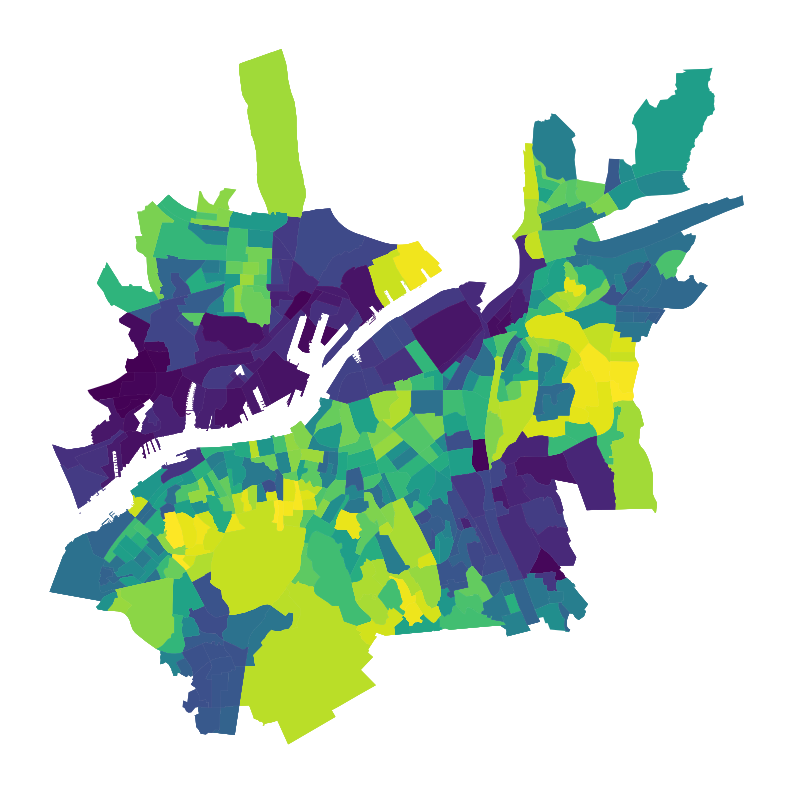

In [47]:
data['gwr_CN'] = CN
data['gwr_CN'] = pd.Categorical(data['gwr_CN'])
if data['gwr_CN'].isna().any():
    print("Warning: NaN values present in 'gwr_CN' column.")
if not data['gwr_CN'].is_unique: pass
    # print("Warning: Non-unique categories present in 'gwr_CN' column.")

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
cmap = 'viridis'
data.plot(column='gwr_CN', cmap=cmap, linewidth=0.01, legend=False, ax=ax)
plt.tight_layout()
ax.axis("off")
plt.savefig('gwr_CN.png', dpi=150, bbox_inches='tight')